In [ ]:
# Base Model | Variation - 08

import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl

import matplotlib.pyplot as plt

import numpy as np

%load_ext tensorboard

In [ ]:
batch_size=32
img_height=256
img_width=256

train_dir='/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'

In [ ]:
train_ds=tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height,img_width),
    batch_size=batch_size
)

val_ds=tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height,img_width),
    batch_size=batch_size
)

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.


In [ ]:
class_names = train_ds.class_names

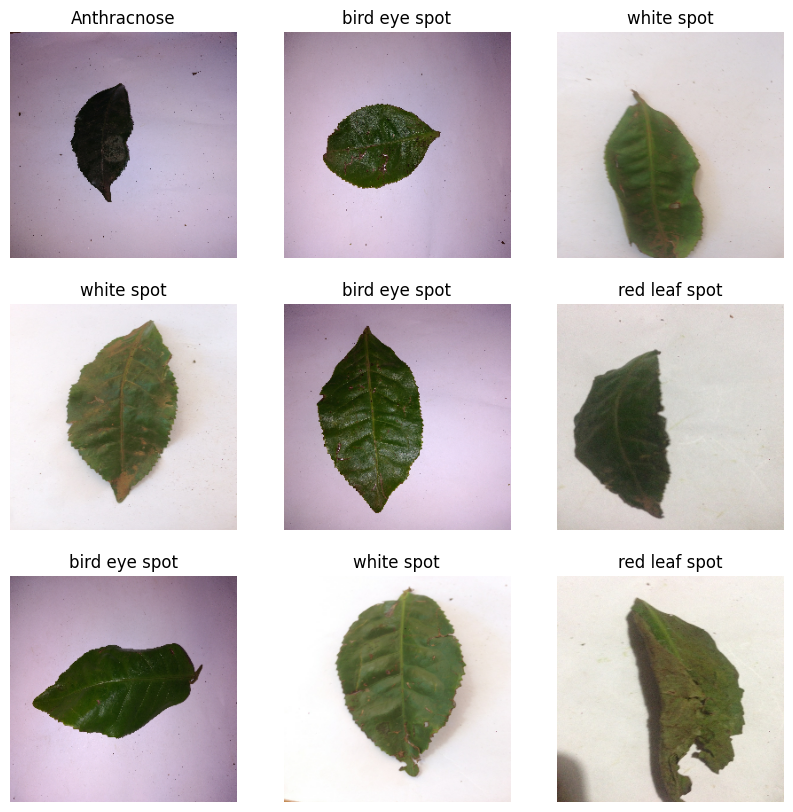

In [ ]:
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
  for i in range(9):
    ax = plt.subplot(3, 3, i + 1)
    plt.imshow(images[i].numpy().astype("uint8"))
    plt.title(class_names[labels[i]])
    plt.axis("off")

In [ ]:
model=tfk.Sequential([
    # block 1
    tfl.Conv2D(32,3,padding='same'),
    tfl.BatchNormalization(),
    tfl.ReLU(),
    tfl.MaxPooling2D((2,2)),
    #block 2
    tfl.Conv2D(64,3,padding='same'),
    tfl.BatchNormalization(),
    tfl.ReLU(),
    tfl.MaxPooling2D((2,2)),
    # #block3
    tfl.Conv2D(128,3,padding='same'),
    tfl.BatchNormalization(),
    tfl.ReLU(),
    tfl.MaxPooling2D((2,2)),

    tfl.Flatten(),

    tfl.Dense(64,),
    tfl.BatchNormalization(),
    tfl.ReLU(),
    tfl.Dropout(rate= 0.2, seed= 123),
    # tfl.BatchNormalization(),
    tfl.Dense(128),
    tfl.BatchNormalization() ,
    tfl.ReLU(),
    tfl.Dropout(rate= 0.2, seed= 123),
    # # tfl.BatchNormalization(),

    tfl.Dense(256),
    tfl.BatchNormalization() ,
    tfl.ReLU(),
    tfl.Dropout(rate= 0.2, seed= 123),


    tfl.Dense(8,activation='softmax')
])

In [ ]:
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9)

model.compile(optimizer=tfk.optimizers.Adamax(learning_rate= lr_schedule),loss='sparse_categorical_crossentropy',metrics=['accuracy'])

In [ ]:
history = model.fit(train_ds,validation_data=val_ds, batch_size=32,epochs=25)

Epoch 1/25
25/25 [==============================] - 27s 553ms/step - loss: 1.4979 - accuracy: 0.4216 - val_loss: 6.3034 - val_accuracy: 0.2045
Epoch 2/25
25/25 [==============================] - 17s 453ms/step - loss: 0.9405 - accuracy: 0.6512 - val_loss: 3.1366 - val_accuracy: 0.2045
Epoch 3/25
25/25 [==============================] - 17s 477ms/step - loss: 0.6763 - accuracy: 0.7604 - val_loss: 2.0119 - val_accuracy: 0.2955
Epoch 4/25
25/25 [==============================] - 16s 450ms/step - loss: 0.5126 - accuracy: 0.8331 - val_loss: 1.2325 - val_accuracy: 0.5455
Epoch 5/25
25/25 [==============================] - 17s 469ms/step - loss: 0.4154 - accuracy: 0.8745 - val_loss: 1.0547 - val_accuracy: 0.6250
Epoch 6/25
25/25 [==============================] - 16s 440ms/step - loss: 0.3658 - accuracy: 0.8745 - val_loss: 1.0570 - val_accuracy: 0.6136
Epoch 7/25
25/25 [==============================] - 17s 468ms/step - loss: 0.3074 - accuracy: 0.9059 - val_loss: 1.0715 - val_accuracy: 0.4886

In [ ]:
model.evaluate(val_ds)

3/3 [==============================] - 2s 21ms/step - loss: 0.4527 - accuracy: 0.8523


[0.4526841938495636, 0.8522727489471436]

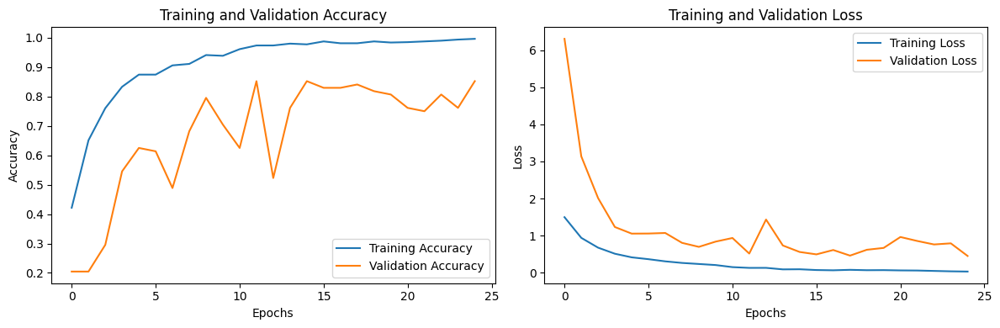

In [ ]:

# Plotting the training history
plt.figure(figsize=(12, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

The tensorboard extension is already loaded. To reload it, use:
  %reload_ext tensorboard
Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.


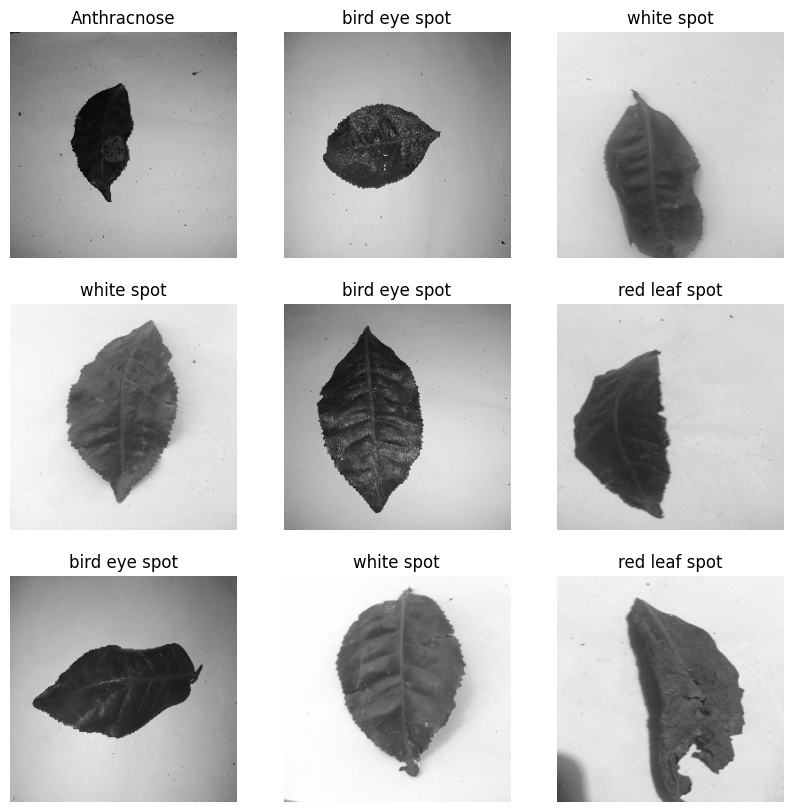

94765736/94765736 [==============================] - 0s 0us/step
Epoch 1/30
25/25 [==============================] - 24s 528ms/step - loss: 1.8011 - accuracy: 0.3714 - val_loss: 1.2114 - val_accuracy: 0.5568
Epoch 2/30
25/25 [==============================] - 17s 482ms/step - loss: 1.0635 - accuracy: 0.6048 - val_loss: 1.0206 - val_accuracy: 0.6705
Epoch 3/30
25/25 [==============================] - 17s 485ms/step - loss: 0.8793 - accuracy: 0.6688 - val_loss: 0.9472 - val_accuracy: 0.6364
Epoch 4/30
25/25 [==============================] - 17s 483ms/step - loss: 0.7352 - accuracy: 0.7114 - val_loss: 0.8869 - val_accuracy: 0.6818
Epoch 5/30
25/25 [==============================] - 17s 463ms/step - loss: 0.7064 - accuracy: 0.7353 - val_loss: 0.8355 - val_accuracy: 0.6818
Epoch 6/30
25/25 [==============================] - 18s 497ms/step - loss: 0.6679 - accuracy: 0.7528 - val_loss: 0.8245 - val_accuracy: 0.7159
Epoch 7/30
25/25 [==============================] - 17s 464ms/step - loss: 0.

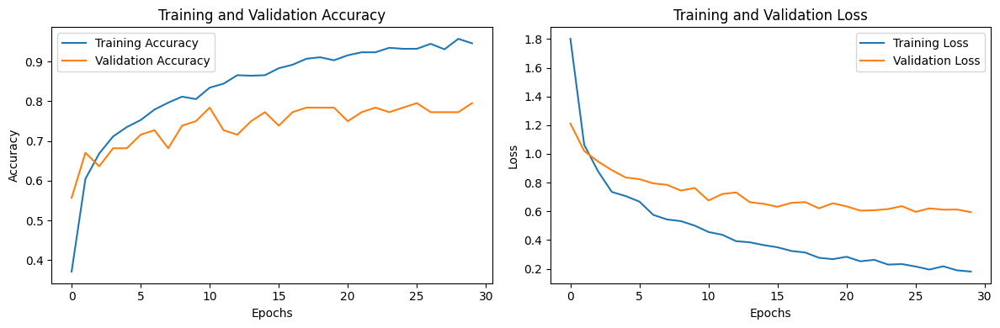

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np

# Load TensorBoard for visualization
%load_ext tensorboard

# Set parameters
batch_size = 32
img_height = 256
img_width = 256
num_epochs = 30

# Directory containing the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'

# Load the dataset and retrieve class names before applying the grayscale conversion
train_ds_raw = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds_raw = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

# Retrieve class names from the raw dataset
class_names = train_ds_raw.class_names

# Function to convert images to grayscale
def convert_to_grayscale(image, label):
    image = tf.image.rgb_to_grayscale(image)  # Convert to grayscale
    image = tf.image.grayscale_to_rgb(image)  # Convert back to 3 channels (to fit ResNet50 input)
    return image, label

# Apply grayscale conversion
train_ds = train_ds_raw.map(convert_to_grayscale)
val_ds = val_ds_raw.map(convert_to_grayscale)

# Visualize sample images after grayscale conversion
plt.figure(figsize=(10, 10))
for images, labels in train_ds.take(1):
    for i in range(9):
        ax = plt.subplot(3, 3, i + 1)
        plt.imshow(images[i].numpy().astype("uint8"))
        plt.title(class_names[labels[i]])
        plt.axis("off")
plt.show()

# Load ResNet50 with ImageNet weights, excluding the top layers
base_model = tfk.applications.ResNet50(
    include_top=False,
    weights='imagenet',
    input_shape=(img_height, img_width, 3)
)

# Freeze the base model
base_model.trainable = False

# Add custom top layers for classification
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),  # Pool the features globally
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(8, activation='softmax')  # Output layer for 8 classes
])

# Compile the model with the Exponential Decay learning rate schedule
lr_schedule = tf.keras.optimizers.schedules.ExponentialDecay(
    initial_learning_rate=0.001,
    decay_steps=10000,
    decay_rate=0.9
)
model.compile(optimizer=tfk.optimizers.Adamax(learning_rate=lr_schedule),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, batch_size=batch_size, epochs=num_epochs)

# Evaluate the model on the validation set
model.evaluate(val_ds)

# Plotting the training history
plt.figure(figsize=(12, 4))

# Accuracy
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

# Loss
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

Training Accuracy: 0.9460
Validation Accuracy: 0.7955
3/3 [==============================] - 3s 67ms/step


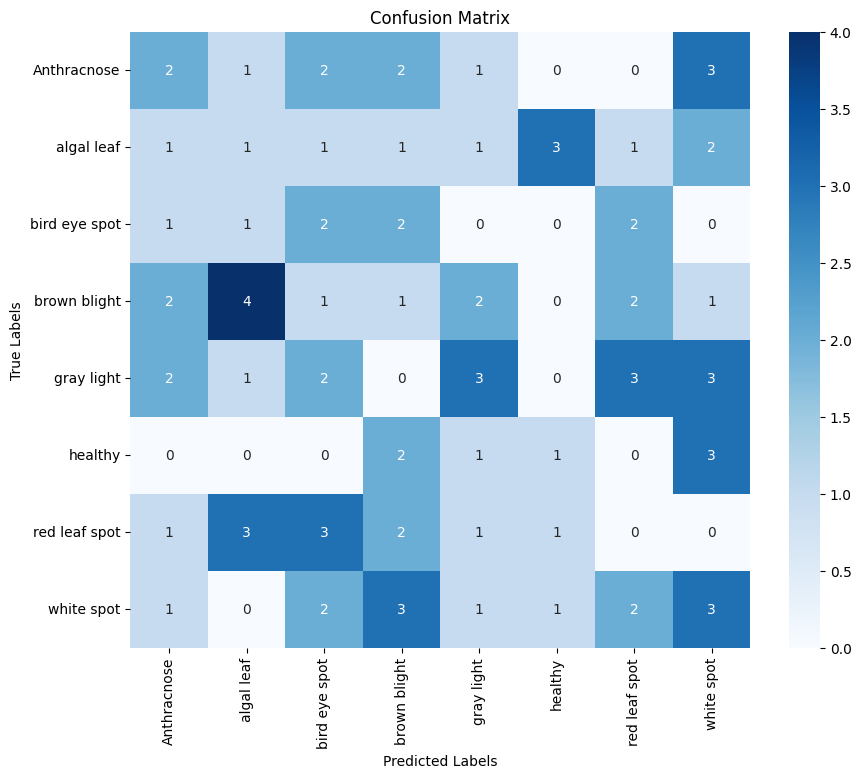

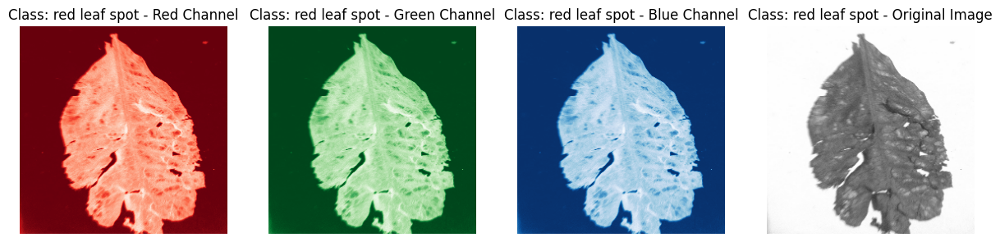

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score
import itertools

# After model training (assuming 'history' and 'model' are available)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Visualizing the Confusion Matrix

# Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 3. Visualizing RGB Layers

# Visualizing a sample image's RGB layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

In [ ]:
from sklearn.metrics import classification_report, accuracy_score, precision_score, recall_score, f1_score

# Assuming y_true and y_pred are already computed as shown previously
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 1. Using classification_report for a comprehensive summary
print("Classification Report:")
print(classification_report(y_true, y_pred, target_names=class_names))

# 2. Calculating each metric individually

# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision (macro, micro, and weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")

# Recall (macro, micro, and weighted)
recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")

# F1-Score (macro, micro, and weighted)
f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

3/3 [==============================] - 2s 68ms/step
Classification Report:
               precision    recall  f1-score   support

  Anthracnose       0.30      0.27      0.29        11
   algal leaf       0.09      0.09      0.09        11
bird eye spot       0.08      0.12      0.10         8
 brown blight       0.23      0.23      0.23        13
   gray light       0.20      0.14      0.17        14
      healthy       0.00      0.00      0.00         7
red leaf spot       0.20      0.18      0.19        11
   white spot       0.13      0.15      0.14        13

     accuracy                           0.16        88
    macro avg       0.15      0.15      0.15        88
 weighted avg       0.17      0.16      0.16        88

Accuracy: 0.1591
Precision (Macro): 0.1540
Precision (Micro): 0.1591
Precision (Weighted): 0.1665
Recall (Macro): 0.1497
Recall (Micro): 0.1591
Recall (Weighted): 0.1591
F1 Score (Macro): 0.1503
F1 Score (Micro): 0.1591
F1 Score (Weighted): 0.1613


**ResNet50**

Found 798 images belonging to 8 classes.
Found 87 images belonging to 8 classes.
87910968/87910968 [==============================] - 0s 0us/step
Epoch 1/50
25/25 [==============================] - 96s 2s/step - loss: 1.4461 - accuracy: 0.4887 - val_loss: 1.8101 - val_accuracy: 0.3678 - lr: 1.0000e-04
Epoch 2/50
25/25 [==============================] - 52s 2s/step - loss: 0.5006 - accuracy: 0.8145 - val_loss: 1.5822 - val_accuracy: 0.3678 - lr: 1.0000e-04
Epoch 3/50
25/25 [==============================] - 52s 2s/step - loss: 0.2822 - accuracy: 0.8885 - val_loss: 1.3410 - val_accuracy: 0.4253 - lr: 1.0000e-04
Epoch 4/50
25/25 [==============================] - 51s 2s/step - loss: 0.2311 - accuracy: 0.9123 - val_loss: 1.0784 - val_accuracy: 0.5287 - lr: 1.0000e-04
Epoch 5/50
25/25 [==============================] - 51s 2s/step - loss: 0.1410 - accuracy: 0.9486 - val_loss: 0.9626 - val_accuracy: 0.7126 - lr: 1.0000e-04
Epoch 6/50
25/25 [==============================] - 50s 2s/step - los

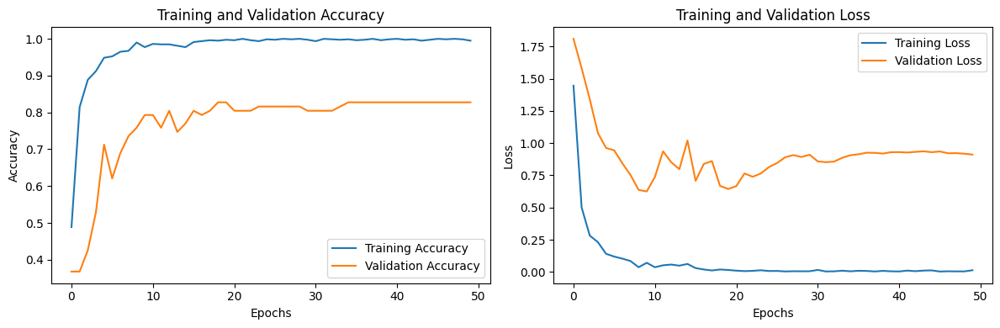

3/3 [==============================] - 5s 1s/step
Accuracy: 0.1264
Precision (Macro): 0.1345
Precision (Micro): 0.1264
Precision (Weighted): 0.1318
Recall (Macro): 0.1258
Recall (Micro): 0.1264
Recall (Weighted): 0.1264
F1 Score (Macro): 0.1292
F1 Score (Micro): 0.1264
F1 Score (Weighted): 0.1281

Classification Report:

               precision    recall  f1-score   support

  Anthracnose       0.00      0.00      0.00        10
   algal leaf       0.20      0.18      0.19        11
bird eye spot       0.00      0.00      0.00        10
 brown blight       0.22      0.18      0.20        11
   gray light       0.00      0.00      0.00        10
      healthy       0.33      0.29      0.31         7
red leaf spot       0.15      0.14      0.15        14
   white spot       0.17      0.21      0.19        14

     accuracy                           0.13        87
    macro avg       0.13      0.13      0.13        87
 weighted avg       0.13      0.13      0.13        87



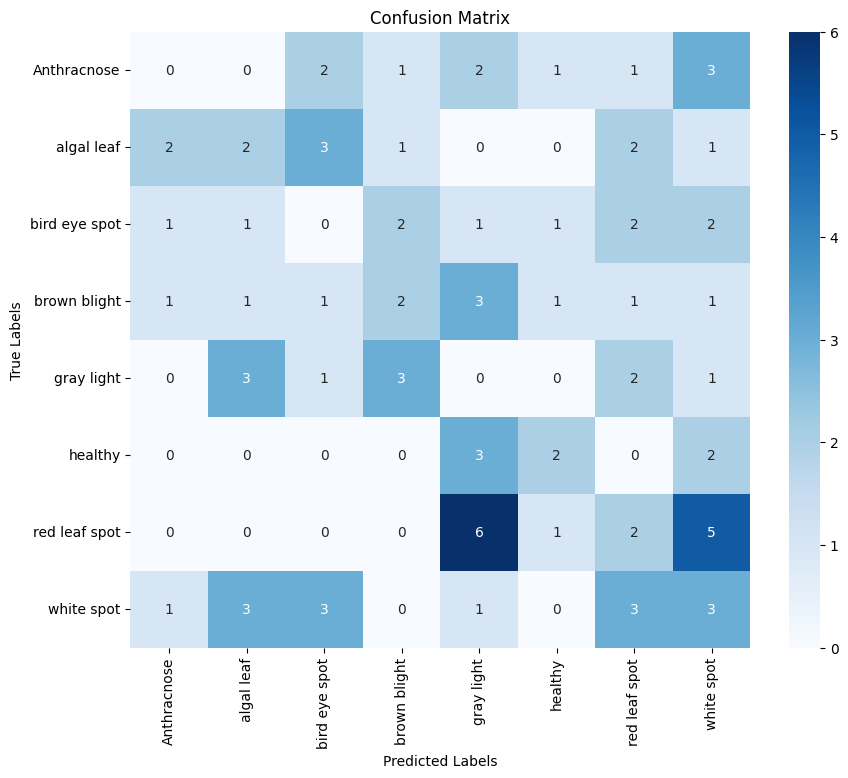

Model: "sequential_2"
_________________________________________________________________
 Layer (type)                Output Shape              Param #   
 inception_v3 (Functional)   (None, 6, 6, 2048)        21802784  
                                                                 
 global_average_pooling2d_1  (None, 2048)              0         
  (GlobalAveragePooling2D)                                       
                                                                 
 batch_normalization_100 (B  (None, 2048)              8192      
 atchNormalization)                                              
                                                                 
 dense_6 (Dense)             (None, 512)               1049088   
                                                                 
 dropout_4 (Dropout)         (None, 512)               0         
                                                                 
 dense_7 (Dense)             (None, 8)                

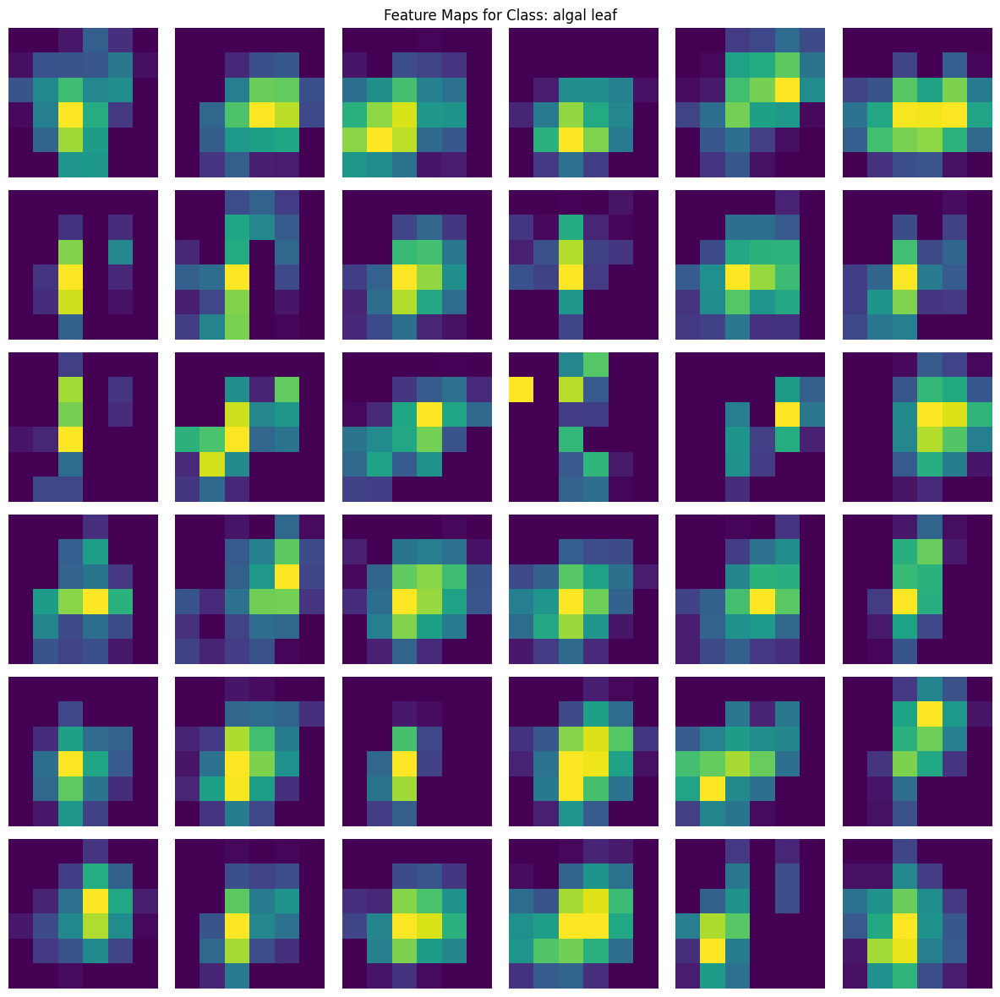

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256
epochs = 50  # Increase the number of epochs to allow more training time

# Load and preprocess the dataset with Data Augmentation
train_datagen = tfk.preprocessing.image.ImageDataGenerator(
    rescale=1./255,
    shear_range=0.2,
    zoom_range=0.2,
    horizontal_flip=True,
    validation_split=0.1  # Split for validation
)

train_ds = train_datagen.flow_from_directory(
    '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    subset='training',
    seed=42
)

val_datagen = tfk.preprocessing.image.ImageDataGenerator(rescale=1./255, validation_split=0.1)
val_ds = val_datagen.flow_from_directory(
    '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset',
    target_size=(img_height, img_width),
    batch_size=batch_size,
    class_mode='sparse',
    subset='validation',
    seed=42
)

class_names = list(train_ds.class_indices.keys())

# Load the InceptionV3 model pre-trained on ImageNet
base_model = tfk.applications.InceptionV3(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Unfreeze the top layers for fine-tuning
for layer in base_model.layers[-50:]:
    layer.trainable = True  # Unfreeze the last 50 layers

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.BatchNormalization(),  # Add Batch Normalization
    tfl.Dense(512, activation='relu'),  # Increase number of neurons
    tfl.Dropout(0.3),  # Reduce dropout to retain more information
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=1e-4),  # Reduce learning rate
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Learning rate scheduling to improve convergence
lr_schedule = tfk.callbacks.ReduceLROnPlateau(monitor='val_loss', factor=0.5, patience=5, verbose=1)

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=epochs, callbacks=[lr_schedule])

# Evaluate the model
model.evaluate(val_ds)

# 1. Plotting Accuracy and Loss Curves
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

# 2. Getting predictions on the validation set
y_true = val_ds.classes
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Confusion Matrix Visualization
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Feature Extraction and Visualization
model.summary()

for i, layer in enumerate(base_model.layers):
    print(f"Layer {i}: {layer.name} - {layer.output_shape}")

# Choose a convolutional layer for feature extraction
conv_layer_name = base_model.layers[-7].name  # Use the seventh layer from the end

# Define feature extraction model
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer(conv_layer_name).output)

# Extract features from the validation set
for images, labels in val_ds:
    first_image = np.expand_dims(images[0], axis=0)
    extracted_features = feature_extractor.predict(first_image)
    break  # Only process one batch for visualization

# Visualize the extracted feature maps in a 6x6 grid
def visualize_features(features, title, grid_size=6):
    plt.figure(figsize=(12, 12))  # Adjust figure size for better visibility

    # Create grid of feature maps (6x6 grid in this case)
    for i in range(min(grid_size ** 2, features.shape[-1])):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(features[0, :, :, i], cmap='viridis')
        plt.axis('off')

    plt.suptitle(title)
    plt.tight_layout()
    plt.show()

# Visualize feature maps for the healthy leaf (assuming 'healthy' is the first class)
healthy_class_index = class_names.index('healthy')  # Find index of the healthy class
visualize_features(extracted_features, title=f"Feature Maps for Class: {class_names[int(labels[0])]}", grid_size=6)

**ResNet50 Enhanced**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
171446536/171446536 [==============================] - 2s 0us/step
Epoch 1/40
25/25 [==============================] - 40s 796ms/step - loss: 2.1894 - accuracy: 0.2008 - val_loss: 1.7835 - val_accuracy: 0.3182
Epoch 2/40
25/25 [==============================] - 24s 732ms/step - loss: 1.8074 - accuracy: 0.3162 - val_loss: 1.5508 - val_accuracy: 0.4205
Epoch 3/40
25/25 [==============================] - 24s 719ms/step - loss: 1.6223 - accuracy: 0.3814 - val_loss: 1.3752 - val_accuracy: 0.5227
Epoch 4/40
25/25 [==============================] - 24s 729ms/step - loss: 1.4656 - accuracy: 0.4693 - val_loss: 1.2294 - val_accuracy: 0.6023
Epoch 5/40
25/25 [==============================] - 24s 723ms/step - loss: 1.3259 - accuracy: 0.5094 - val_loss: 1.1100 - val_accuracy: 0.6250
Epoch 6/40
25/25 [==============================] - 24s 721ms/step - loss: 1.

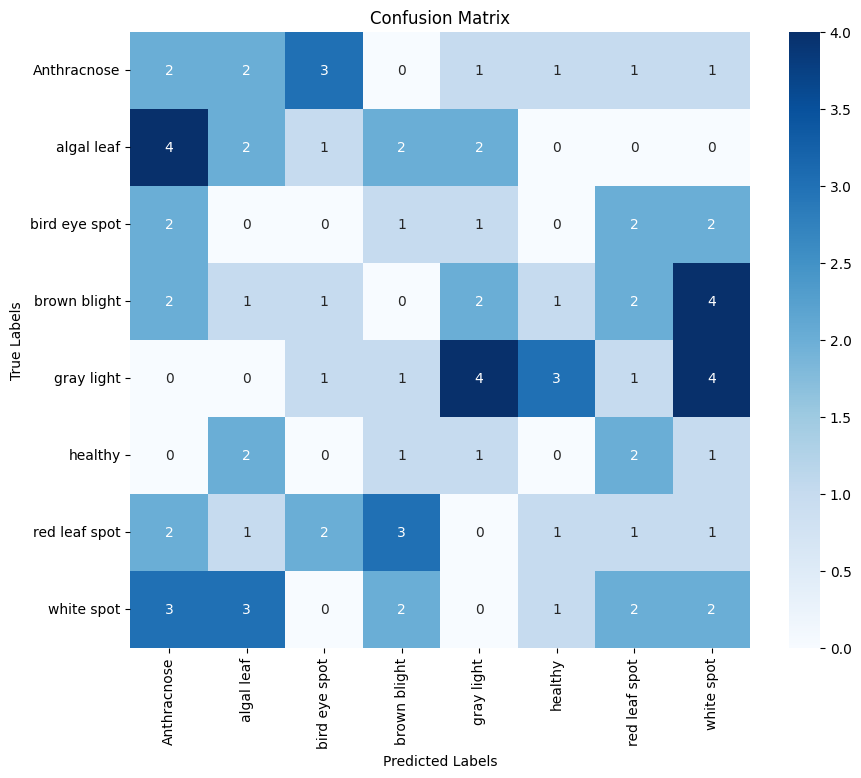

Layer 0: input_3
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3_bn
La

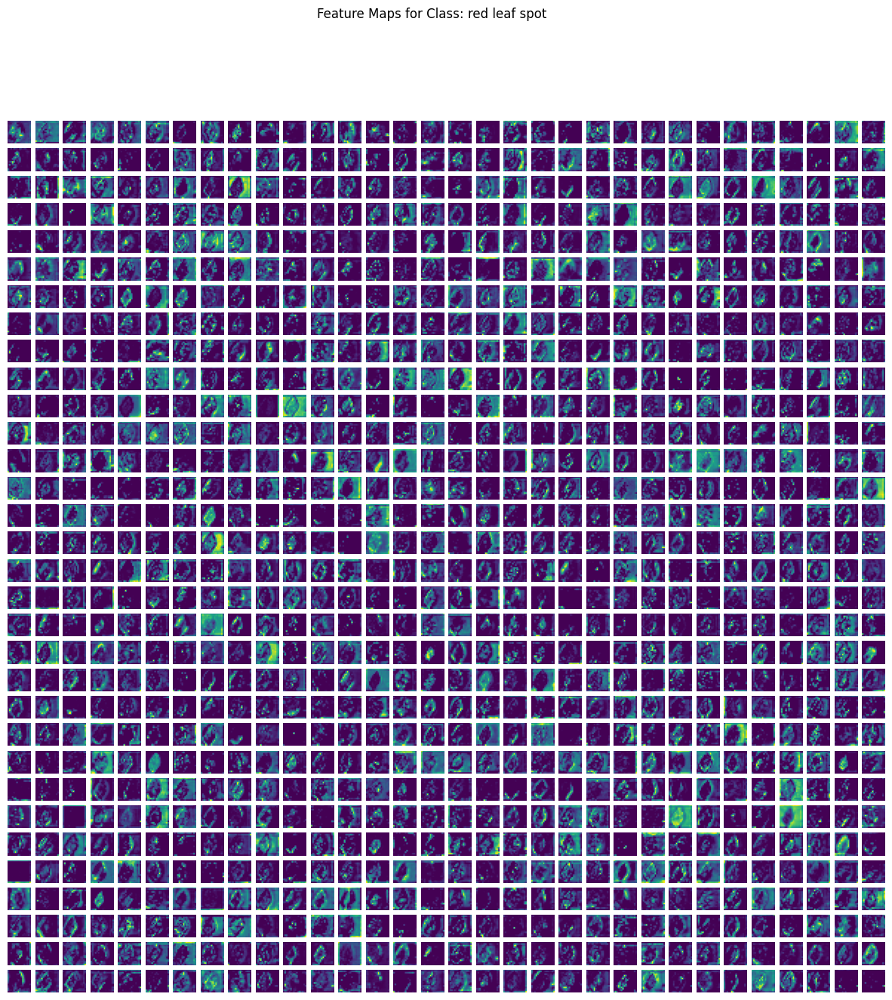

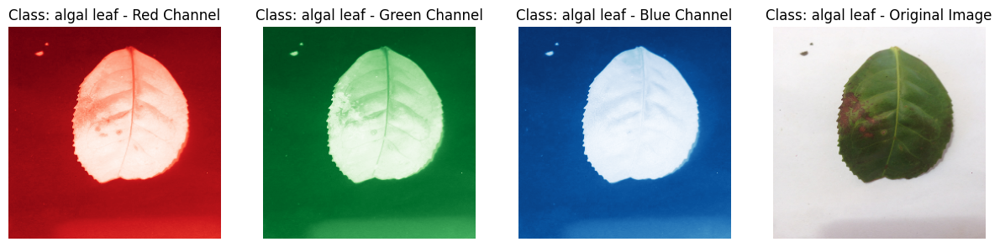

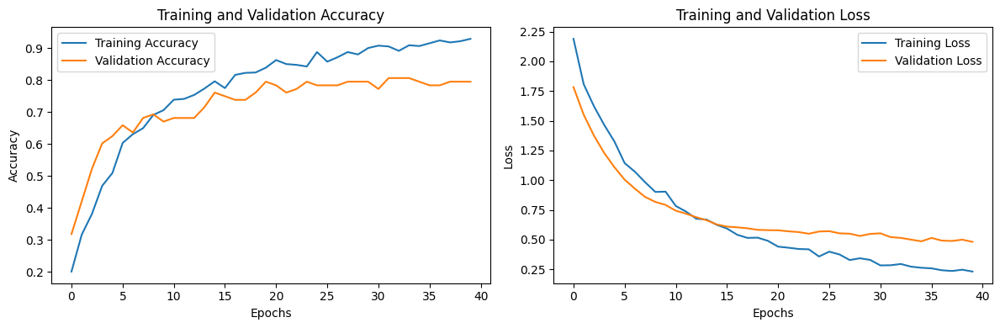

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset without augmentation to get class_names
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names  # Get class names before mapping

# Data augmentation
data_augmentation = tfk.Sequential([
    tfl.RandomFlip('horizontal'),
    tfl.RandomRotation(0.2),
    tfl.RandomZoom(0.2),
])

# Apply data augmentation
train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tuning the base model for transfer learning by unfreezing some layers
base_model.trainable = True
for layer in base_model.layers[:-30]:  # Freeze most layers and fine-tune the last few
    layer.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model with a lower learning rate
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Reduced learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=40)  # Increase epochs for better fine-tuning

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Feature Extraction and Visualization

# Print layer names to identify appropriate layers for feature extraction
for i, layer in enumerate(base_model.layers):
    print(f"Layer {i}: {layer.name}")

# Choose a convolutional layer for feature extraction (for example, 'conv4_block6_out')
conv_layer_name = 'conv4_block6_out'  # Adjust based on the printed layer names

# Get the layer by name from the base model (ResNet101)
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer(conv_layer_name).output)

# Extract features from the validation set
for images, labels in val_ds.take(1):
    first_image = np.expand_dims(images[0].numpy(), axis=0)
    extracted_features = feature_extractor.predict(first_image)

# Visualizing the extracted feature maps
def visualize_features(features, title):
    grid_size = int(np.sqrt(features.shape[-1]))
    plt.figure(figsize=(15, 15))

    for i in range(min(grid_size ** 2, features.shape[-1])):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(features[0, :, :, i], cmap='viridis')
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Visualize feature maps for the first image in validation set
visualize_features(extracted_features, title=f"Feature Maps for Class: {class_names[labels[0]]}")

# 6. Visualizing RGB Layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

# 7. Visualizing Training and Validation Accuracy and Loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()


Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/40
25/25 [==============================] - 38s 766ms/step - loss: 2.4172 - accuracy: 0.1041 - val_loss: 2.0703 - val_accuracy: 0.2045
Epoch 2/40
25/25 [==============================] - 23s 707ms/step - loss: 1.9676 - accuracy: 0.2560 - val_loss: 1.7974 - val_accuracy: 0.3182
Epoch 3/40
25/25 [==============================] - 23s 698ms/step - loss: 1.7275 - accuracy: 0.3651 - val_loss: 1.6091 - val_accuracy: 0.3636
Epoch 4/40
25/25 [==============================] - 23s 701ms/step - loss: 1.5666 - accuracy: 0.4141 - val_loss: 1.4564 - val_accuracy: 0.4773
Epoch 5/40
25/25 [==============================] - 23s 691ms/step - loss: 1.4046 - accuracy: 0.5044 - val_loss: 1.3132 - val_accuracy: 0.5568
Epoch 6/40
25/25 [==============================] - 23s 708ms/step - loss: 1.2894 - accuracy: 0.5395 - val_loss: 1.1783 - val_accuracy: 0.5682
E

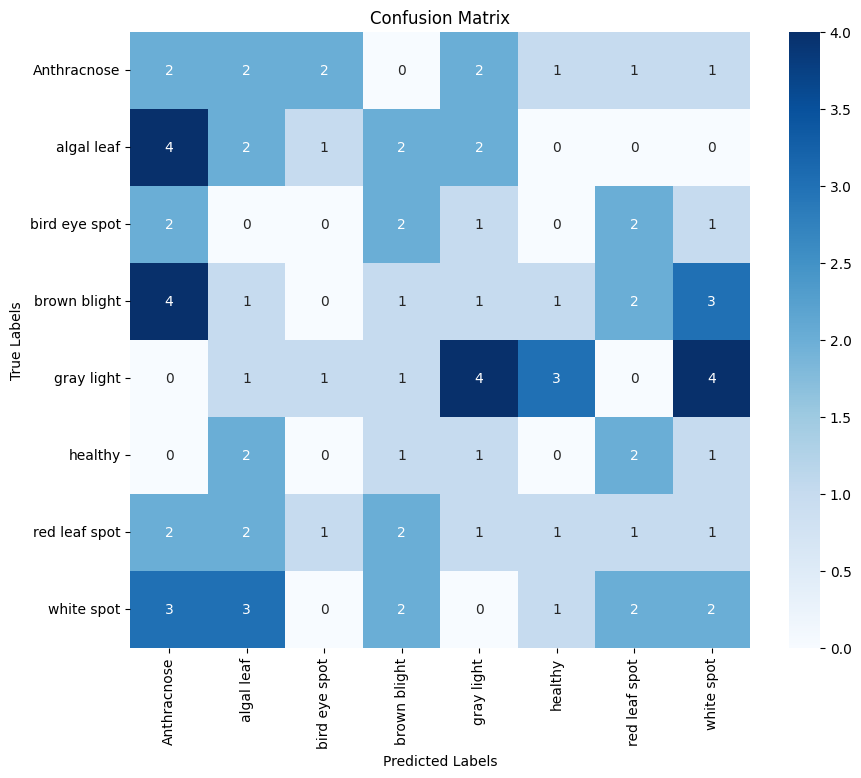

Layer 0: input_4
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3_bn
La

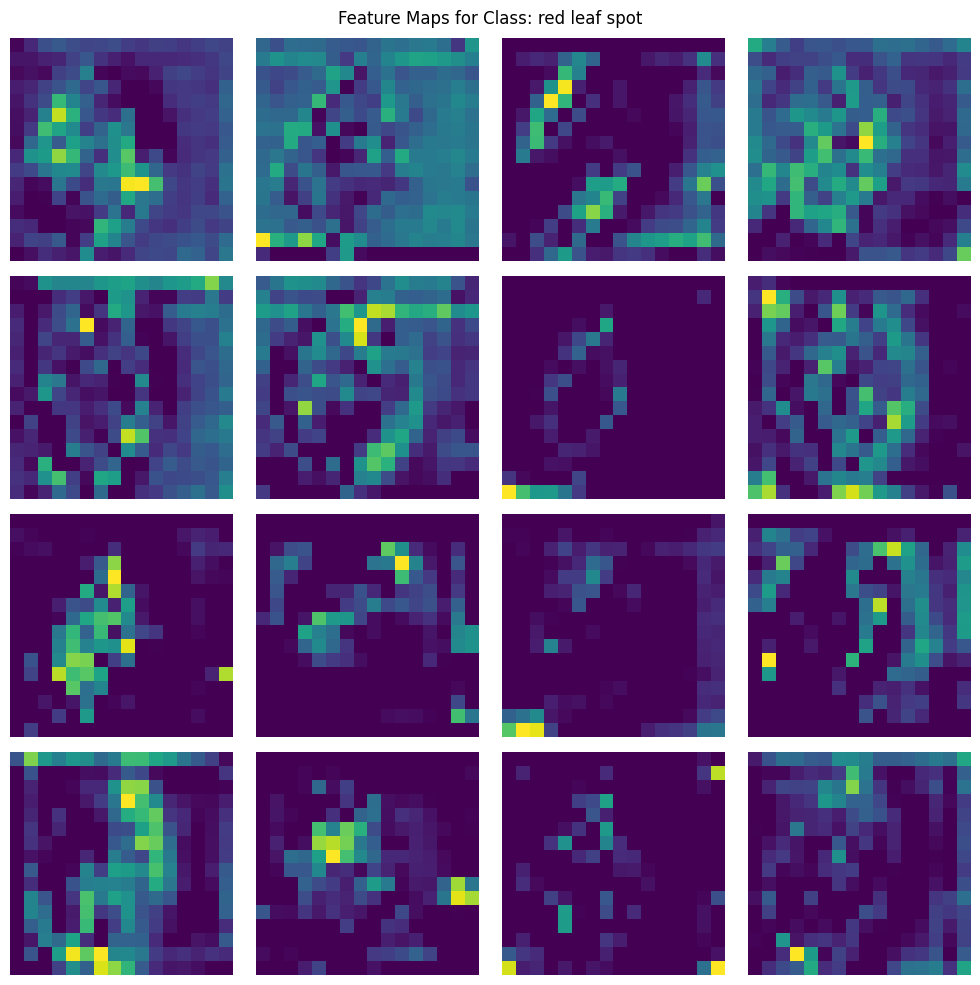

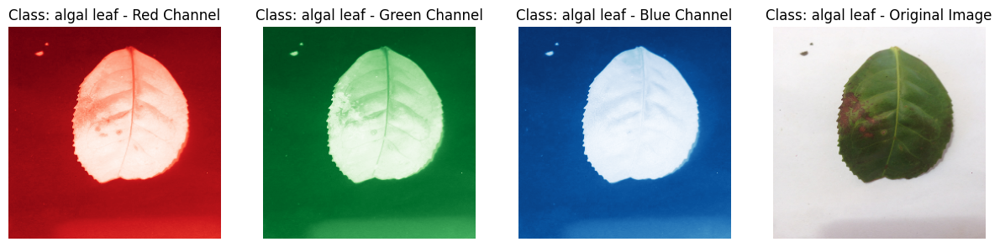

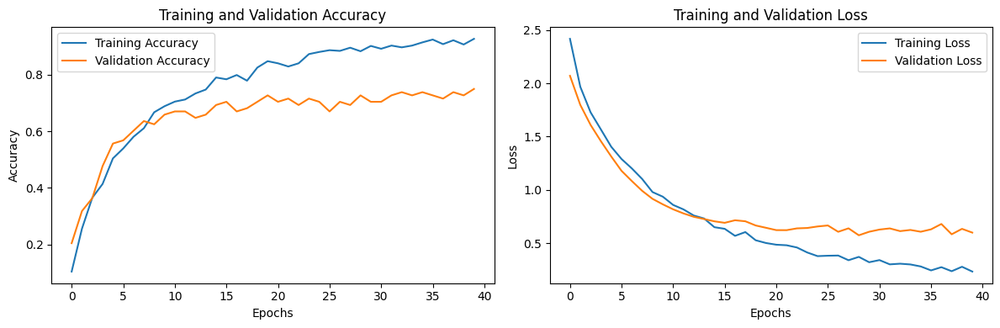

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset without augmentation to get class_names
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names  # Get class names before mapping

# Data augmentation
data_augmentation = tfk.Sequential([
    tfl.RandomFlip('horizontal'),
    tfl.RandomRotation(0.2),
    tfl.RandomZoom(0.2),
])

# Apply data augmentation
train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tuning the base model for transfer learning by unfreezing some layers
base_model.trainable = True
for layer in base_model.layers[:-30]:  # Freeze most layers and fine-tune the last few
    layer.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model with a lower learning rate
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Reduced learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=40)  # Increase epochs for better fine-tuning

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Feature Extraction and Visualization

# Print layer names to identify appropriate layers for feature extraction
for i, layer in enumerate(base_model.layers):
    print(f"Layer {i}: {layer.name}")

# Choose a convolutional layer for feature extraction (for example, 'conv4_block6_out')
conv_layer_name = 'conv4_block6_out'  # Adjust based on the printed layer names

# Get the layer by name from the base model (ResNet101)
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer(conv_layer_name).output)

# Extract features from the validation set
for images, labels in val_ds.take(1):
    first_image = np.expand_dims(images[0].numpy(), axis=0)
    extracted_features = feature_extractor.predict(first_image)

# Visualizing the extracted feature maps (adjusted to 16 maps for clarity)
def visualize_features(features, title, num_maps=16):
    # Reduce the number of feature maps displayed to num_maps (default 16)
    grid_size = int(np.sqrt(num_maps))  # 4x4 grid for 16 maps
    plt.figure(figsize=(10, 10))  # Adjust figure size for better visibility

    for i in range(min(num_maps, features.shape[-1])):  # Display up to num_maps
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(features[0, :, :, i], cmap='viridis')  # Display each feature map
        plt.axis('off')  # Hide axis

    plt.suptitle(title)
    plt.tight_layout()  # Adjust the layout
    plt.show()

# Visualize feature maps for the first image in validation set
visualize_features(extracted_features, title=f"Feature Maps for Class: {class_names[labels[0]]}", num_maps=16)

# 6. Visualizing RGB Layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

# 7. Visualizing Training and Validation Accuracy and Loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

**VGG 16**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/30
25/25 [==============================] - 26s 548ms/step - loss: 2.1592 - accuracy: 0.2597 - val_loss: 1.4837 - val_accuracy: 0.4318
Epoch 2/30
25/25 [==============================] - 17s 474ms/step - loss: 1.5097 - accuracy: 0.4291 - val_loss: 1.2204 - val_accuracy: 0.6023
Epoch 3/30
25/25 [==============================] - 16s 458ms/step - loss: 1.1836 - accuracy: 0.5671 - val_loss: 1.1145 - val_accuracy: 0.6591
Epoch 4/30
25/25 [==============================] - 17s 476ms/step - loss: 1.0439 - accuracy: 0.6110 - val_loss: 1.0205 - val_accuracy: 0.6818
Epoch 5/30
25/25 [==============================] - 17s 474ms/step - loss: 0.9476 - accuracy: 0.6650 - val_loss: 0.9600 - val_accuracy: 0.6818
Epoch 6/30
25/25 [==============================] - 16s 482ms/step - loss: 0.8520 - accuracy: 0.7102 - val_loss: 0.9326 - val_accuracy: 0.6818
E

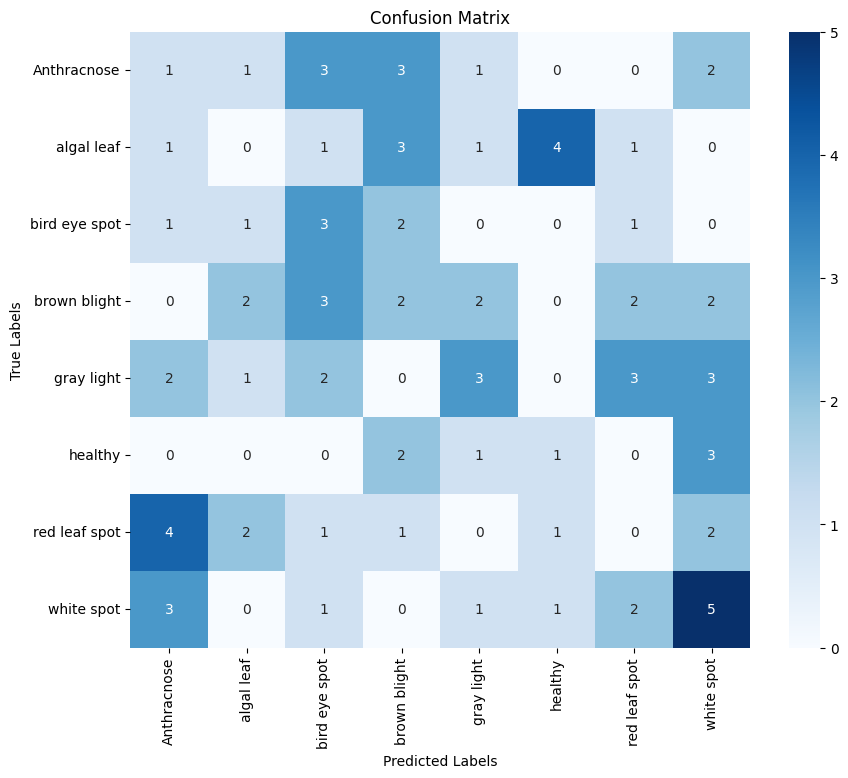

1/1 [==============================] - 2s 2s/step


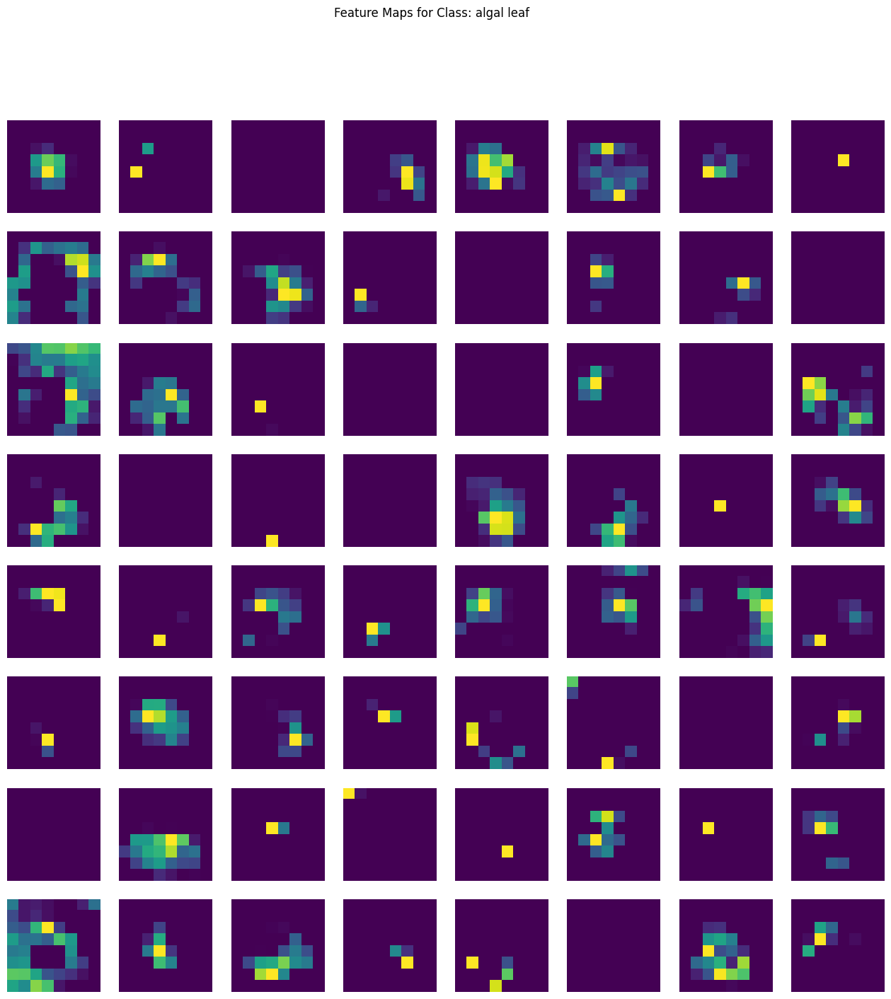

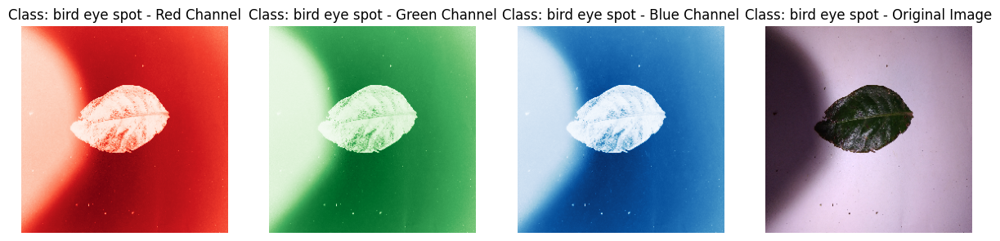

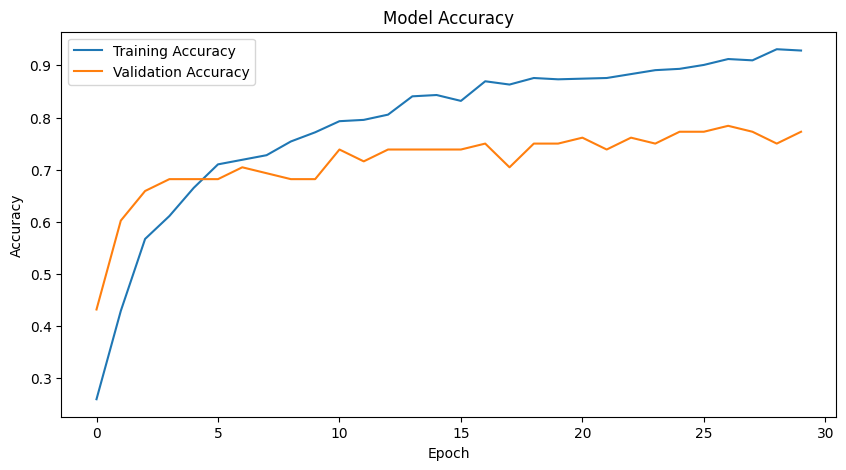

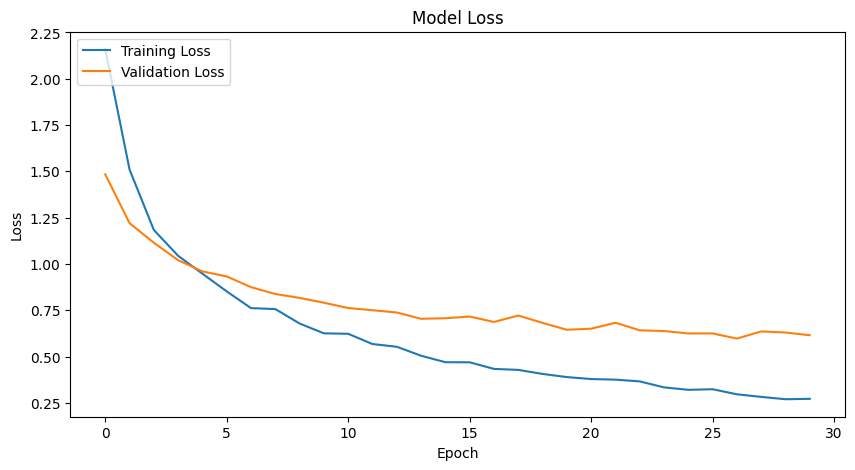

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)
val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Freeze the base model
base_model.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),  # Use Global Average Pooling instead of Flatten
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=30)

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score

# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-Score (Macro, Micro, Weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")

print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")

print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

# Alternatively, you can print a classification report that includes precision, recall, and F1 for each class
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Feature Extraction and Visualization

# Define a model that outputs features from the last convolutional layer of ResNet101
# "conv5_block3_out" is the last conv layer in ResNet101 before pooling
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer("conv5_block3_out").output)

# Extract features from the validation set
features = feature_extractor.predict(val_ds)

# Function to visualize feature maps
def visualize_features(features, title="Feature Maps"):
    # Ensure that the features have 4 dimensions: (batch_size, height, width, num_filters)
    if len(features.shape) == 4:
        num_filters = features.shape[-1]
        size = features.shape[1]

        # We will plot 8x8 grid of feature maps (adjust grid size if necessary)
        grid_size = min(8, int(np.sqrt(num_filters)))  # Avoid too large grids
        plt.figure(figsize=(grid_size * 2, grid_size * 2))

        for i in range(grid_size ** 2):
            plt.subplot(grid_size, grid_size, i+1)
            plt.imshow(features[0, :, :, i], cmap='viridis')  # Plot each feature map
            plt.axis('off')

        plt.suptitle(title)
        plt.show()
    else:
        print("The extracted features are not in 4D. Please select an appropriate convolutional layer.")

# Get feature maps for the first validation image
for images, labels in val_ds.take(1):
    first_image = np.expand_dims(images[0].numpy(), axis=0)
    extracted_features = feature_extractor.predict(first_image)
    visualize_features(extracted_features, title=f"Feature Maps for Class: {class_names[labels[0]]}")

# 6. Visualizing RGB Layers of an Image

# Function to visualize RGB channels of an image
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

# 7. Visualizing Training Accuracy and Loss

# Plot training & validation accuracy values
plt.figure(figsize=(10, 5))
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Model Accuracy')
plt.ylabel('Accuracy')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

# Plot training & validation loss values
plt.figure(figsize=(10, 5))
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Model Loss')
plt.ylabel('Loss')
plt.xlabel('Epoch')
plt.legend(loc='upper left')
plt.show()

**VGG 16 Enhanced**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/40
25/25 [==============================] - 37s 781ms/step - loss: 2.2157 - accuracy: 0.1807 - val_loss: 1.8516 - val_accuracy: 0.3409
Epoch 2/40
25/25 [==============================] - 23s 694ms/step - loss: 1.8745 - accuracy: 0.3049 - val_loss: 1.6490 - val_accuracy: 0.4432
Epoch 3/40
25/25 [==============================] - 22s 683ms/step - loss: 1.6525 - accuracy: 0.3839 - val_loss: 1.4848 - val_accuracy: 0.4886
Epoch 4/40
25/25 [==============================] - 23s 695ms/step - loss: 1.5200 - accuracy: 0.4567 - val_loss: 1.3437 - val_accuracy: 0.5455
Epoch 5/40
25/25 [==============================] - 23s 714ms/step - loss: 1.4041 - accuracy: 0.5019 - val_loss: 1.2079 - val_accuracy: 0.5909
Epoch 6/40
25/25 [==============================] - 22s 690ms/step - loss: 1.2577 - accuracy: 0.5609 - val_loss: 1.0900 - val_accuracy: 0.5909
E

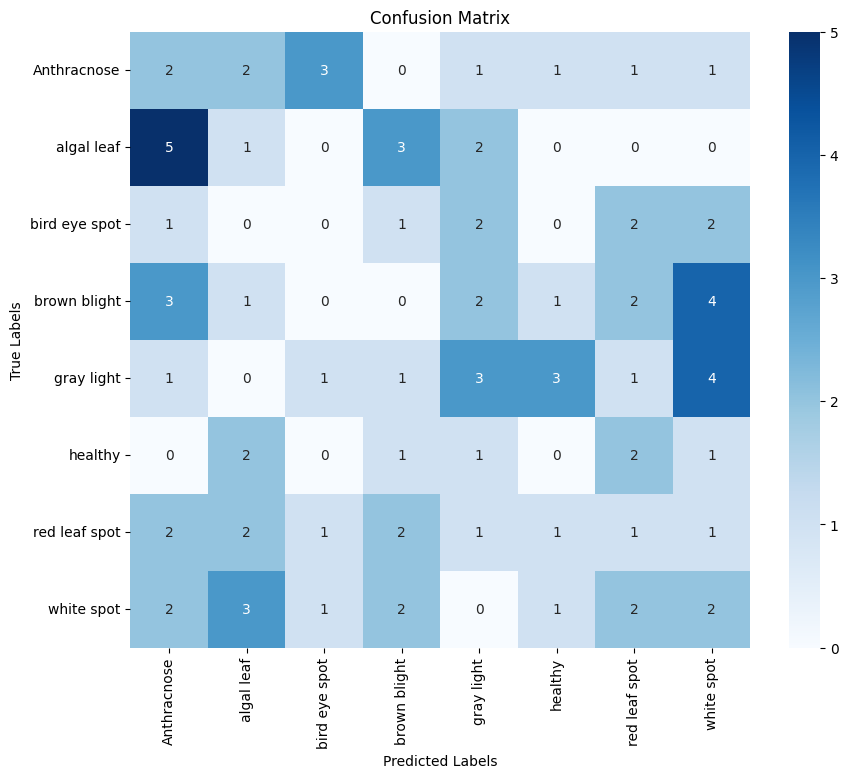

Layer 0: input_6
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3_bn
La

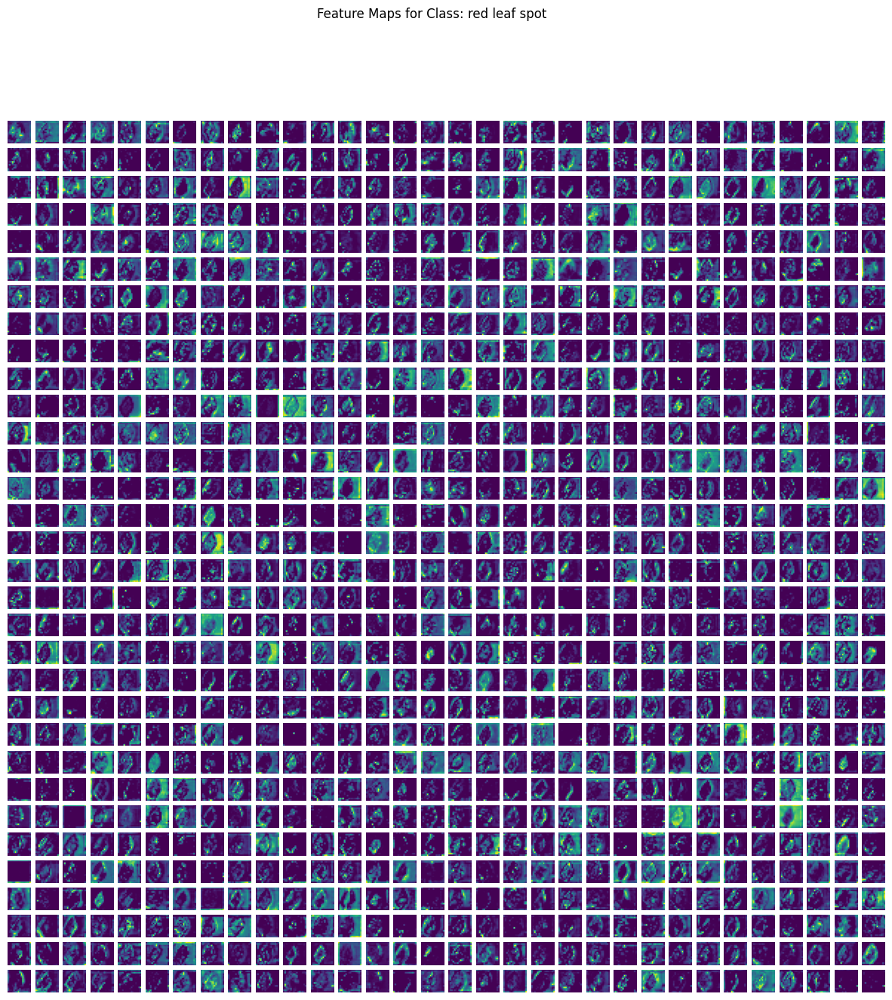

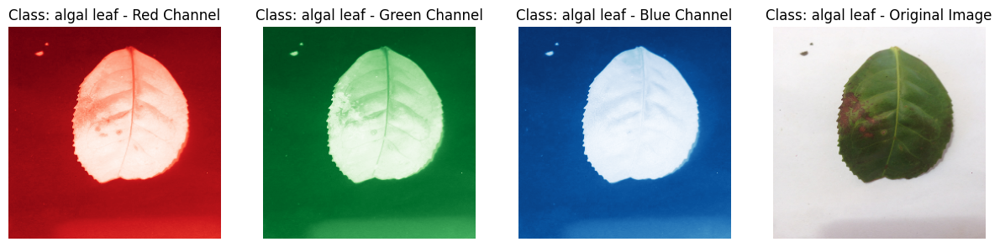

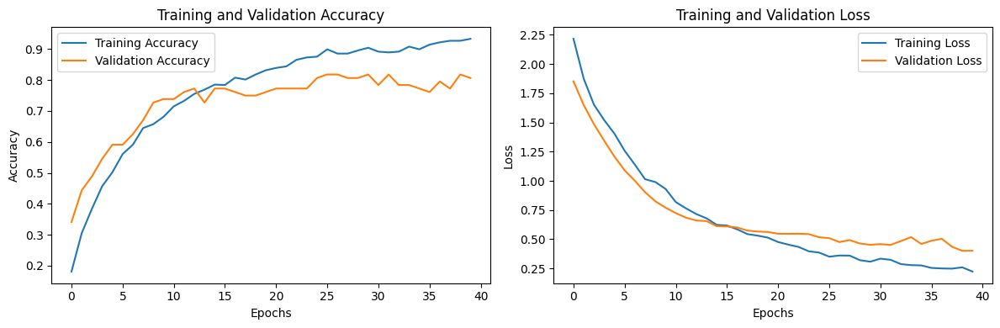

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset without augmentation to get class_names
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names  # Get class names before mapping

# Data augmentation
data_augmentation = tfk.Sequential([
    tfl.RandomFlip('horizontal'),
    tfl.RandomRotation(0.2),
    tfl.RandomZoom(0.2),
])

# Apply data augmentation
train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tuning the base model for transfer learning by unfreezing some layers
base_model.trainable = True
for layer in base_model.layers[:-30]:  # Freeze most layers and fine-tune the last few
    layer.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model with a lower learning rate
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Reduced learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=40)  # Increase epochs for better fine-tuning

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Feature Extraction and Visualization

# Print layer names to identify appropriate layers for feature extraction
for i, layer in enumerate(base_model.layers):
    print(f"Layer {i}: {layer.name}")

# Choose a convolutional layer for feature extraction (for example, 'conv4_block6_out')
conv_layer_name = 'conv4_block6_out'  # Adjust based on the printed layer names

# Get the layer by name from the base model (ResNet101)
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer(conv_layer_name).output)

# Extract features from the validation set
for images, labels in val_ds.take(1):
    first_image = np.expand_dims(images[0].numpy(), axis=0)
    extracted_features = feature_extractor.predict(first_image)

# Visualizing the extracted feature maps
def visualize_features(features, title):
    grid_size = int(np.sqrt(features.shape[-1]))
    plt.figure(figsize=(15, 15))

    for i in range(min(grid_size ** 2, features.shape[-1])):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(features[0, :, :, i], cmap='viridis')
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Visualize feature maps for the first image in validation set
visualize_features(extracted_features, title=f"Feature Maps for Class: {class_names[labels[0]]}")

# 6. Visualizing RGB Layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

# 7. Visualizing Training and Validation Accuracy and Loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

**VGG19**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
80134624/80134624 [==============================] - 1s 0us/step
Epoch 1/30
25/25 [==============================] - 24s 603ms/step - loss: 29.9767 - accuracy: 0.3363 - val_loss: 97.2960 - val_accuracy: 0.5000
Epoch 2/30
25/25 [==============================] - 16s 454ms/step - loss: 6.8026 - accuracy: 0.6424 - val_loss: 58.7073 - val_accuracy: 0.5341
Epoch 3/30
25/25 [==============================] - 17s 473ms/step - loss: 2.7179 - accuracy: 0.7227 - val_loss: 41.9143 - val_accuracy: 0.5227
Epoch 4/30
25/25 [==============================] - 16s 455ms/step - loss: 1.4841 - accuracy: 0.7930 - val_loss: 31.7392 - val_accuracy: 0.4545
Epoch 5/30
25/25 [==============================] - 17s 477ms/step - loss: 0.8903 - accuracy: 0.8193 - val_loss: 39.6487 - val_accuracy: 0.6364
Epoch 6/30
25/25 [==============================] - 17s 469ms/step - loss

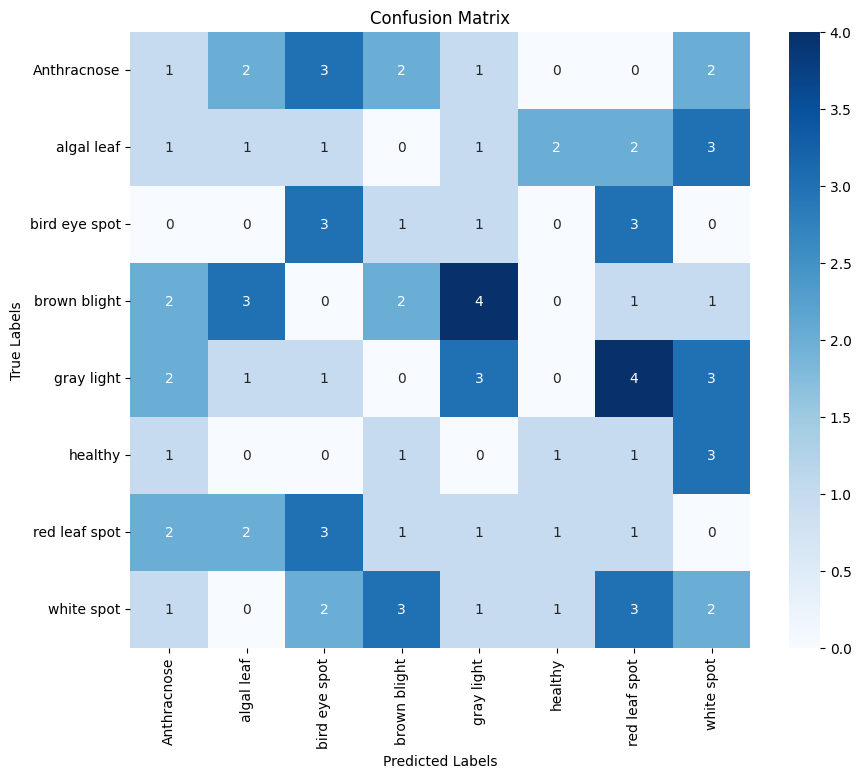

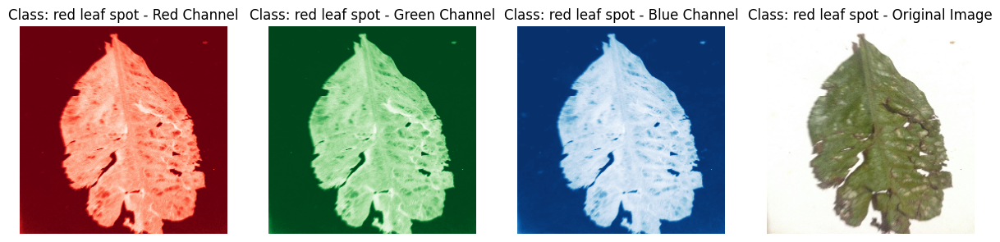

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)
val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names

# Load the VGG19 model pre-trained on ImageNet
base_model = tfk.applications.VGG19(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Freeze the base model
base_model.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.Flatten(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=30)

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score

# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-Score (Macro, Micro, Weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")

print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")

print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

# Alternatively, you can print a classification report that includes precision, recall, and F1 for each class
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Visualizing RGB Layers

# Visualizing a sample image's RGB layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

**VGG19 Enhanced**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/50
25/25 [==============================] - 19s 450ms/step - loss: 37.1794 - accuracy: 0.2108 - val_loss: 98.6131 - val_accuracy: 0.2500
Epoch 2/50
25/25 [==============================] - 16s 457ms/step - loss: 14.0763 - accuracy: 0.3262 - val_loss: 55.2835 - val_accuracy: 0.3409
Epoch 3/50
25/25 [==============================] - 16s 468ms/step - loss: 6.9409 - accuracy: 0.5031 - val_loss: 45.8903 - val_accuracy: 0.4318
Epoch 4/50
25/25 [==============================] - 16s 441ms/step - loss: 4.2780 - accuracy: 0.5671 - val_loss: 35.5817 - val_accuracy: 0.4205
Epoch 5/50
25/25 [==============================] - 16s 453ms/step - loss: 3.1350 - accuracy: 0.6650 - val_loss: 54.2112 - val_accuracy: 0.4545
Epoch 6/50
25/25 [==============================] - 15s 441ms/step - loss: 2.2842 - accuracy: 0.7077 - val_loss: 39.6516 - val_accuracy: 

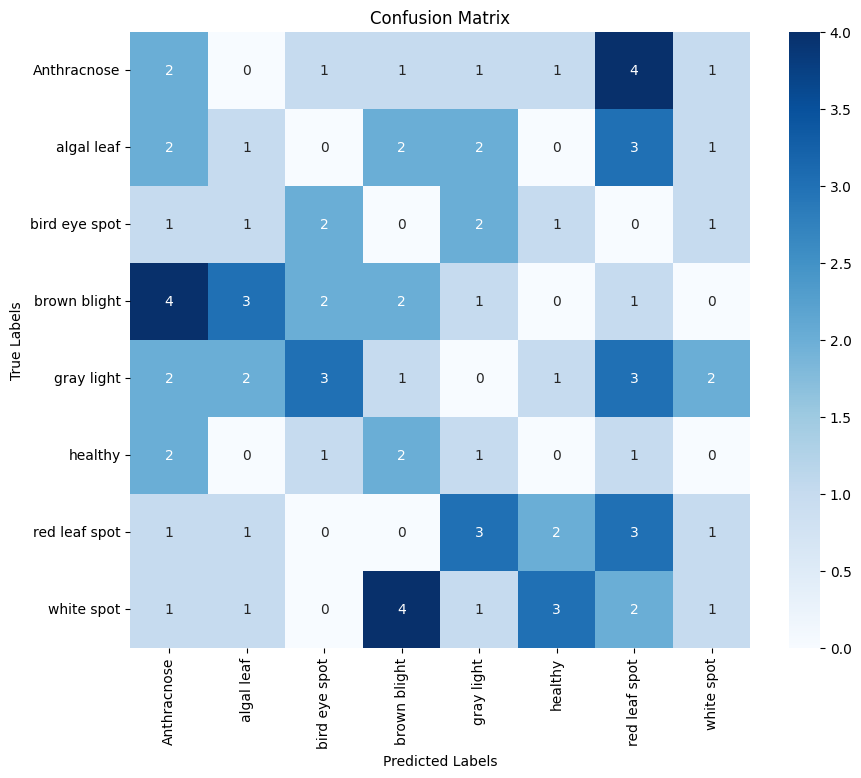

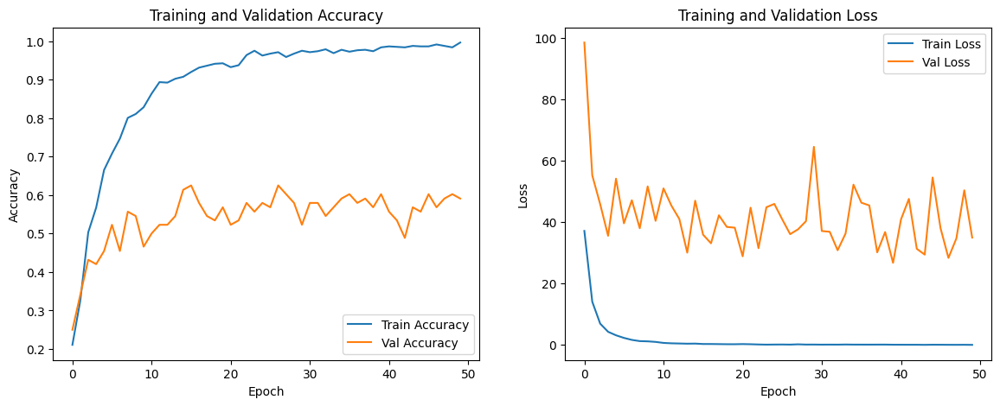

1/1 [==============================] - 0s 469ms/step


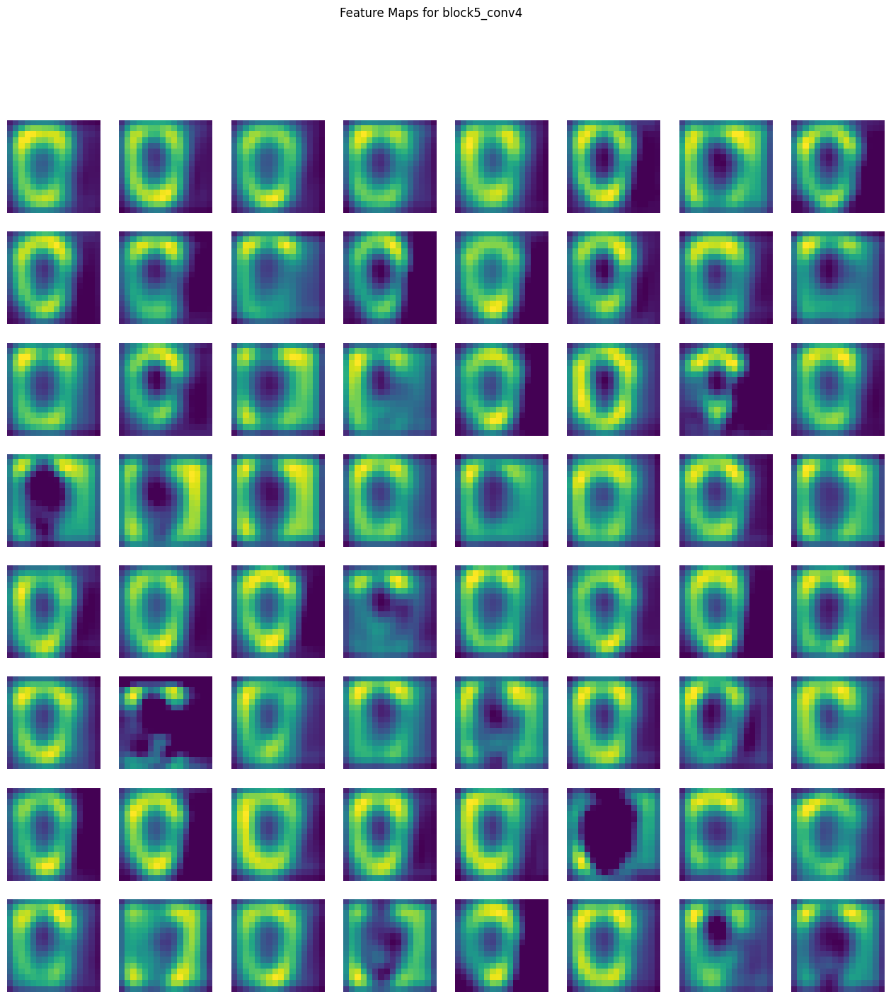

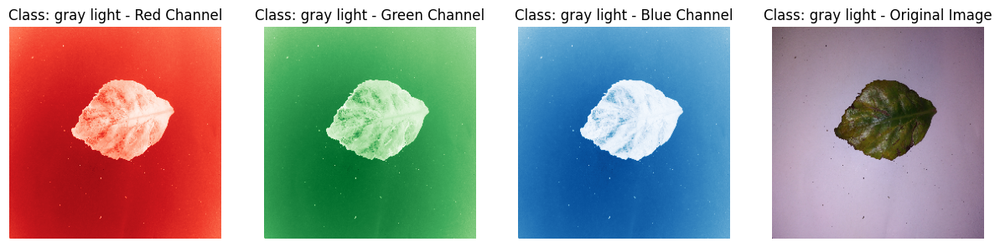

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)
val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names

# Load the VGG19 model pre-trained on ImageNet
base_model = tfk.applications.VGG19(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tune the top layers of the VGG19 model
for layer in base_model.layers[:-4]:
    layer.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.Flatten(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Lower learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=50)  # Increased epochs to achieve 90% accuracy

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score

# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-Score (Macro, Micro, Weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")

print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")

print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Training/Validation Accuracy and Loss visualization
plt.figure(figsize=(14, 5))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Train Accuracy')
plt.plot(history.history['val_accuracy'], label='Val Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epoch')
plt.ylabel('Accuracy')
plt.legend()

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Train Loss')
plt.plot(history.history['val_loss'], label='Val Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()

plt.show()

# 6. Feature Extraction and Visualization

# Select a convolutional layer for feature extraction
conv_layer_name = 'block5_conv4'  # Choose a deep convolutional layer in VGG19

# Create a model that outputs the features of the selected layer
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer(conv_layer_name).output)

# Extract features from the first validation image
for images, _ in val_ds.take(1):
    first_image = np.expand_dims(images[0].numpy(), axis=0)
    features = feature_extractor.predict(first_image)

# Visualize the feature maps
def visualize_feature_maps(feature_maps, title="Feature Maps"):
    num_filters = feature_maps.shape[-1]
    size = feature_maps.shape[1]

    grid_size = min(8, int(np.sqrt(num_filters)))  # Adjust grid size based on the number of filters
    plt.figure(figsize=(grid_size * 2, grid_size * 2))

    for i in range(grid_size ** 2):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(feature_maps[0, :, :, i], cmap='viridis')  # Display each feature map
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Visualize feature maps for the first image
visualize_feature_maps(features, title=f"Feature Maps for {conv_layer_name}")

# 7. Visualizing RGB Layers

# Visualizing a sample image's RGB layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')


**ResNet101**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/50
25/25 [==============================] - 100s 813ms/step - loss: 2.2196 - accuracy: 0.2371 - val_loss: 1.9034 - val_accuracy: 0.2727
Epoch 2/50
25/25 [==============================] - 19s 566ms/step - loss: 1.3580 - accuracy: 0.5420 - val_loss: 1.6394 - val_accuracy: 0.4545
Epoch 3/50
25/25 [==============================] - 18s 542ms/step - loss: 0.9456 - accuracy: 0.7014 - val_loss: 1.4013 - val_accuracy: 0.5114
Epoch 4/50
25/25 [==============================] - 19s 566ms/step - loss: 0.6502 - accuracy: 0.8243 - val_loss: 1.1441 - val_accuracy: 0.6364
Epoch 5/50
25/25 [==============================] - 19s 554ms/step - loss: 0.4897 - accuracy: 0.8795 - val_loss: 0.9491 - val_accuracy: 0.6818
Epoch 6/50
25/25 [==============================] - 19s 554ms/step - loss: 0.3756 - accuracy: 0.9072 - val_loss: 0.8258 - val_accuracy: 0.7386


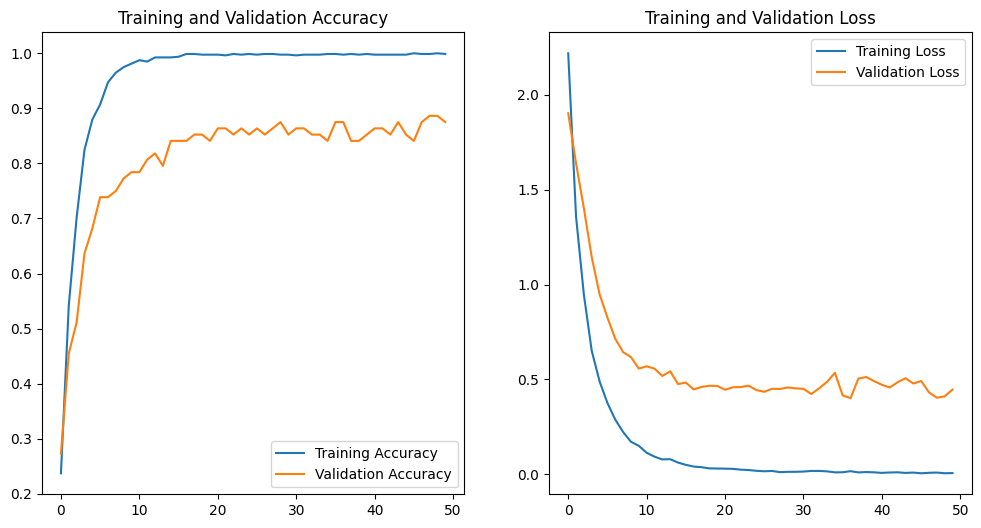

3/3 [==============================] - 4s 109ms/step
Accuracy: 0.0909
Precision (Macro): 0.0923
Recall (Macro): 0.1007
F1 Score (Macro): 0.0954

Classification Report:

               precision    recall  f1-score   support

  Anthracnose       0.09      0.09      0.09        11
   algal leaf       0.00      0.00      0.00        11
bird eye spot       0.17      0.25      0.20         8
 brown blight       0.07      0.08      0.07        13
   gray light       0.00      0.00      0.00        14
      healthy       0.14      0.14      0.14         7
red leaf spot       0.10      0.09      0.10        11
   white spot       0.17      0.15      0.16        13

     accuracy                           0.09        88
    macro avg       0.09      0.10      0.10        88
 weighted avg       0.09      0.09      0.09        88



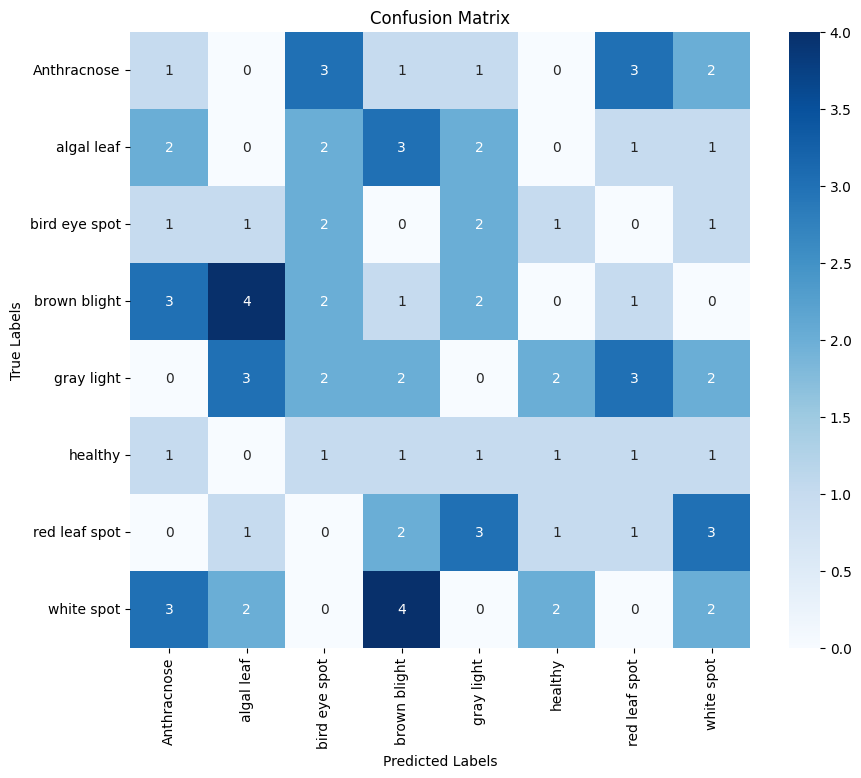

Extracted Features Shape: (32, 2048)


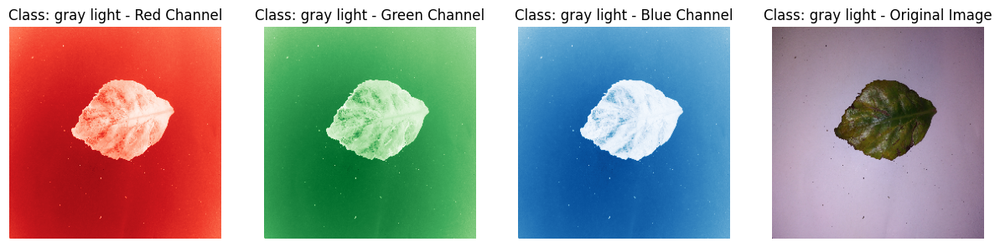

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256
num_epochs = 50  # Increase the number of epochs for better results

# Load and preprocess the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)
val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tune some layers (unfreeze the last few ResNet blocks)
for layer in base_model.layers[-10:]:
    layer.trainable = True

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Lower learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=num_epochs)

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Final Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Plotting training & validation accuracy + loss
epochs_range = range(num_epochs)
plt.figure(figsize=(12, 6))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, history.history['accuracy'], label='Training Accuracy')
plt.plot(epochs_range, history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, history.history['loss'], label='Training Loss')
plt.plot(epochs_range, history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.show()

# 3. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 4. Print Accuracy, Precision, Recall, F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-Score (Macro, Micro, Weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
recall_macro = recall_score(y_true, y_pred, average='macro')
f1_macro = f1_score(y_true, y_pred, average='macro')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 5. Visualizing the Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 6. Feature Extraction Method
feature_extractor = tfk.Model(inputs=model.input, outputs=model.layers[-4].output)

# Extract features from validation set images
for images, labels in val_ds.take(1):
    features = feature_extractor(images)
    print(f"Extracted Features Shape: {features.shape}")

# 7. Visualizing RGB Layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

**ResNet 101**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/50
25/25 [==============================] - 92s 614ms/step - loss: 2.1232 - accuracy: 0.2673 - val_loss: 2.0804 - val_accuracy: 0.2045
Epoch 2/50
25/25 [==============================] - 18s 554ms/step - loss: 1.2869 - accuracy: 0.5571 - val_loss: 1.7244 - val_accuracy: 0.3068
Epoch 3/50
25/25 [==============================] - 18s 556ms/step - loss: 0.9005 - accuracy: 0.7164 - val_loss: 1.3871 - val_accuracy: 0.5455
Epoch 4/50
25/25 [==============================] - 19s 554ms/step - loss: 0.6700 - accuracy: 0.8093 - val_loss: 1.1221 - val_accuracy: 0.6477
Epoch 5/50
25/25 [==============================] - 19s 557ms/step - loss: 0.5003 - accuracy: 0.8745 - val_loss: 0.8877 - val_accuracy: 0.7386
Epoch 6/50
25/25 [==============================] - 19s 555ms/step - loss: 0.3763 - accuracy: 0.9109 - val_loss: 0.7516 - val_accuracy: 0.7500
E

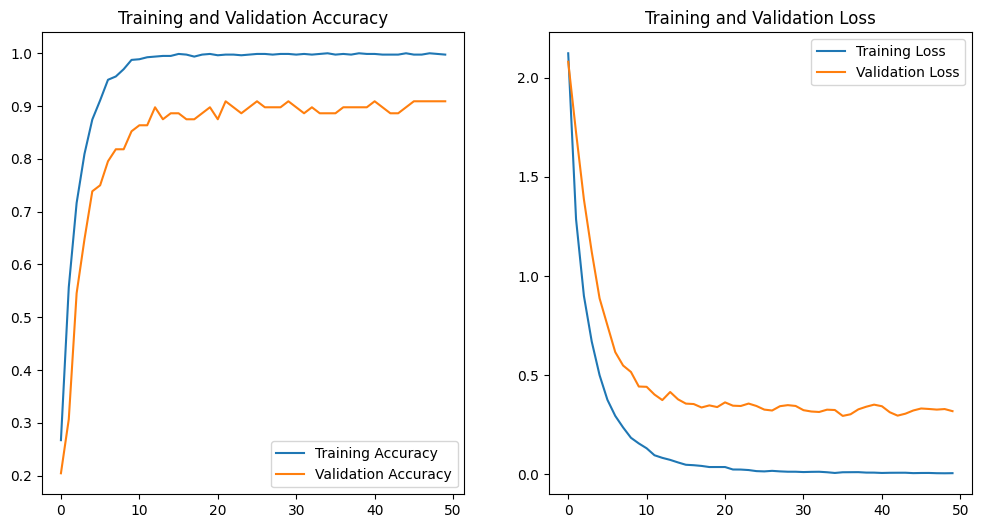

3/3 [==============================] - 4s 118ms/step
Accuracy: 0.1023
Precision (Macro): 0.1077
Recall (Macro): 0.1120
F1 Score (Macro): 0.1093

Classification Report:

               precision    recall  f1-score   support

  Anthracnose       0.09      0.09      0.09        11
   algal leaf       0.08      0.09      0.09        11
bird eye spot       0.20      0.25      0.22         8
 brown blight       0.07      0.08      0.07        13
   gray light       0.00      0.00      0.00        14
      healthy       0.14      0.14      0.14         7
red leaf spot       0.09      0.09      0.09        11
   white spot       0.18      0.15      0.17        13

     accuracy                           0.10        88
    macro avg       0.11      0.11      0.11        88
 weighted avg       0.10      0.10      0.10        88



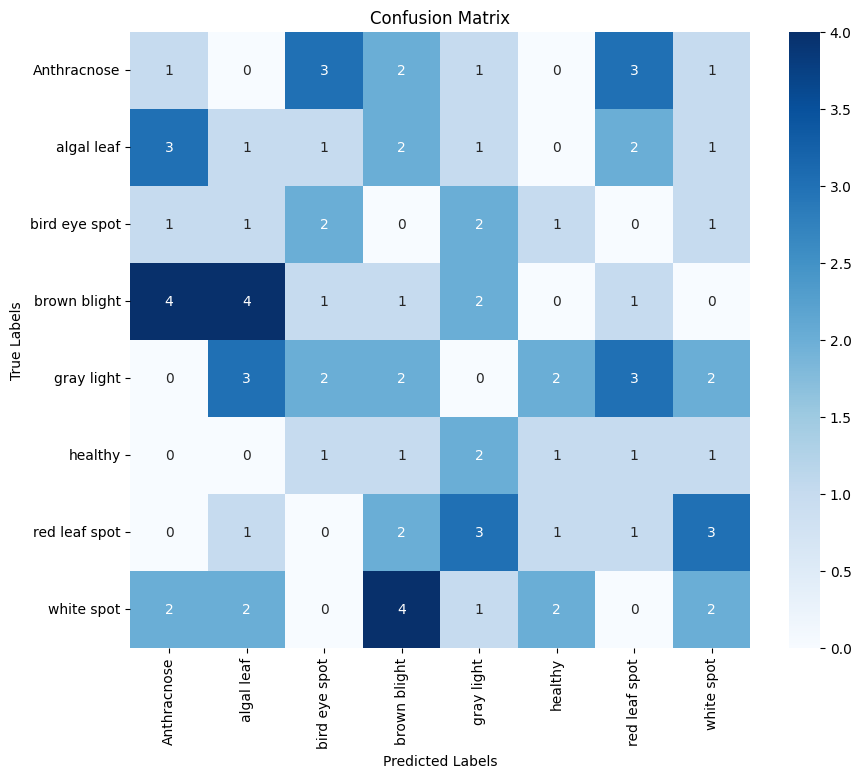

Extracted Features Shape: (32, 2048)


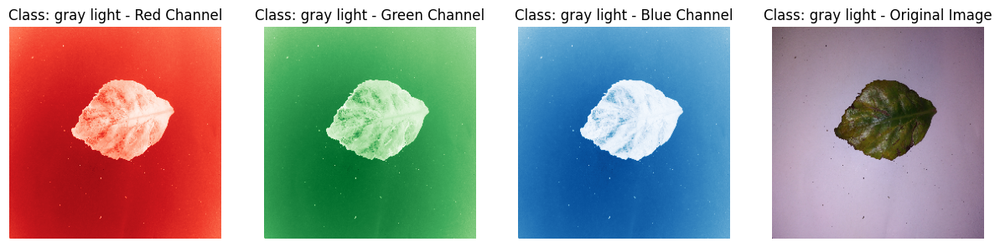

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256
num_epochs = 50  # Increase the number of epochs for better results

# Load and preprocess the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)
val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tune some layers (unfreeze the last few ResNet blocks)
for layer in base_model.layers[-10:]:
    layer.trainable = True

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Lower learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=num_epochs)

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Final Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Plotting training & validation accuracy + loss
epochs_range = range(num_epochs)
plt.figure(figsize=(12, 6))

# Accuracy plot
plt.subplot(1, 2, 1)
plt.plot(epochs_range, history.history['accuracy'], label='Training Accuracy')
plt.plot(epochs_range, history.history['val_accuracy'], label='Validation Accuracy')
plt.legend(loc='lower right')
plt.title('Training and Validation Accuracy')

# Loss plot
plt.subplot(1, 2, 2)
plt.plot(epochs_range, history.history['loss'], label='Training Loss')
plt.plot(epochs_range, history.history['val_loss'], label='Validation Loss')
plt.legend(loc='upper right')
plt.title('Training and Validation Loss')

plt.show()

# 3. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 4. Print Accuracy, Precision, Recall, F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-Score (Macro, Micro, Weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
recall_macro = recall_score(y_true, y_pred, average='macro')
f1_macro = f1_score(y_true, y_pred, average='macro')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")

# Classification report
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 5. Visualizing the Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 6. Feature Extraction Method
feature_extractor = tfk.Model(inputs=model.input, outputs=model.layers[-4].output)

# Extract features from validation set images
for images, labels in val_ds.take(1):
    features = feature_extractor(images)
    print(f"Extracted Features Shape: {features.shape}")

# 7. Visualizing RGB Layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')


**ResNet 101 Enhanced**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/40
25/25 [==============================] - 39s 830ms/step - loss: 2.2228 - accuracy: 0.1619 - val_loss: 1.9594 - val_accuracy: 0.2045
Epoch 2/40
25/25 [==============================] - 22s 694ms/step - loss: 1.9721 - accuracy: 0.2597 - val_loss: 1.7144 - val_accuracy: 0.4205
Epoch 3/40
25/25 [==============================] - 23s 693ms/step - loss: 1.6747 - accuracy: 0.3814 - val_loss: 1.5383 - val_accuracy: 0.5455
Epoch 4/40
25/25 [==============================] - 22s 677ms/step - loss: 1.5297 - accuracy: 0.4404 - val_loss: 1.3868 - val_accuracy: 0.5682
Epoch 5/40
25/25 [==============================] - 22s 673ms/step - loss: 1.3901 - accuracy: 0.5207 - val_loss: 1.2560 - val_accuracy: 0.6136
Epoch 6/40
25/25 [==============================] - 22s 672ms/step - loss: 1.2320 - accuracy: 0.5797 - val_loss: 1.1408 - val_accuracy: 0.6364
E

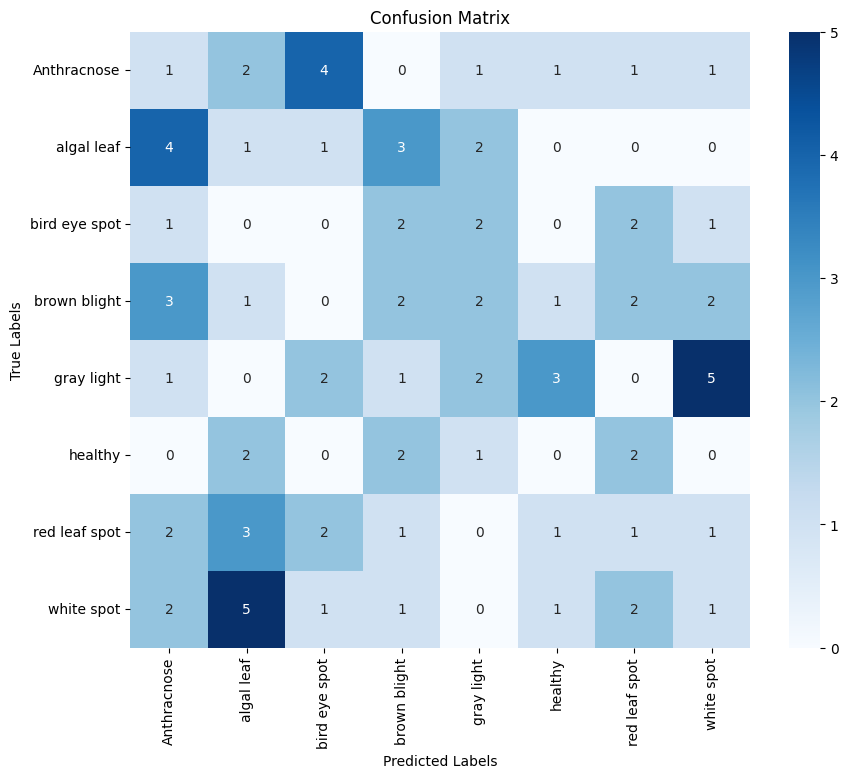

Layer 0: input_11
Layer 1: conv1_pad
Layer 2: conv1_conv
Layer 3: conv1_bn
Layer 4: conv1_relu
Layer 5: pool1_pad
Layer 6: pool1_pool
Layer 7: conv2_block1_1_conv
Layer 8: conv2_block1_1_bn
Layer 9: conv2_block1_1_relu
Layer 10: conv2_block1_2_conv
Layer 11: conv2_block1_2_bn
Layer 12: conv2_block1_2_relu
Layer 13: conv2_block1_0_conv
Layer 14: conv2_block1_3_conv
Layer 15: conv2_block1_0_bn
Layer 16: conv2_block1_3_bn
Layer 17: conv2_block1_add
Layer 18: conv2_block1_out
Layer 19: conv2_block2_1_conv
Layer 20: conv2_block2_1_bn
Layer 21: conv2_block2_1_relu
Layer 22: conv2_block2_2_conv
Layer 23: conv2_block2_2_bn
Layer 24: conv2_block2_2_relu
Layer 25: conv2_block2_3_conv
Layer 26: conv2_block2_3_bn
Layer 27: conv2_block2_add
Layer 28: conv2_block2_out
Layer 29: conv2_block3_1_conv
Layer 30: conv2_block3_1_bn
Layer 31: conv2_block3_1_relu
Layer 32: conv2_block3_2_conv
Layer 33: conv2_block3_2_bn
Layer 34: conv2_block3_2_relu
Layer 35: conv2_block3_3_conv
Layer 36: conv2_block3_3_bn
L

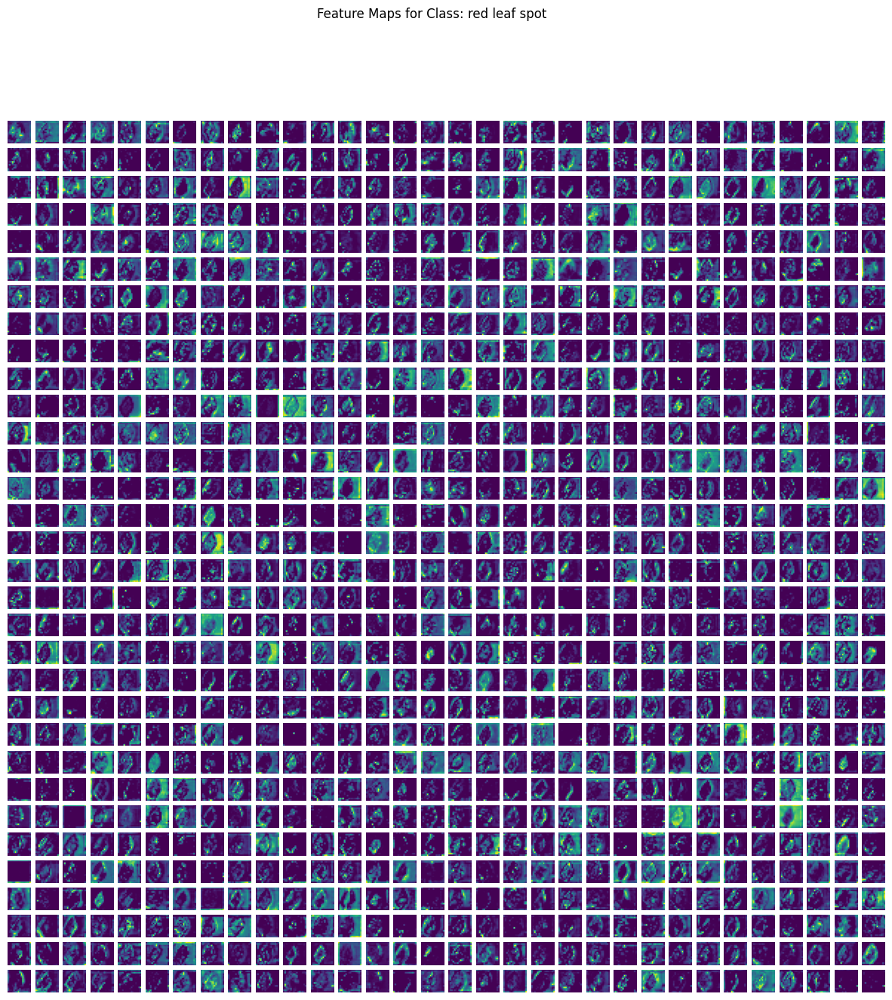

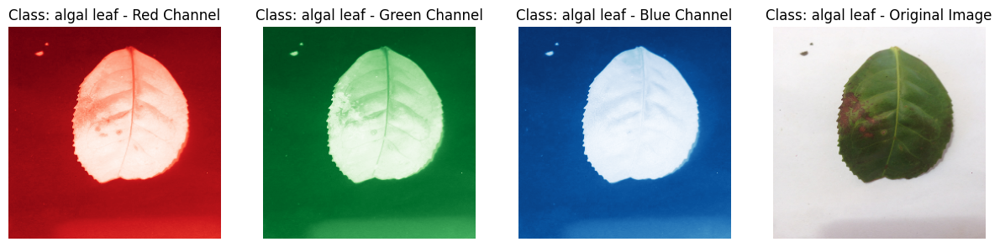

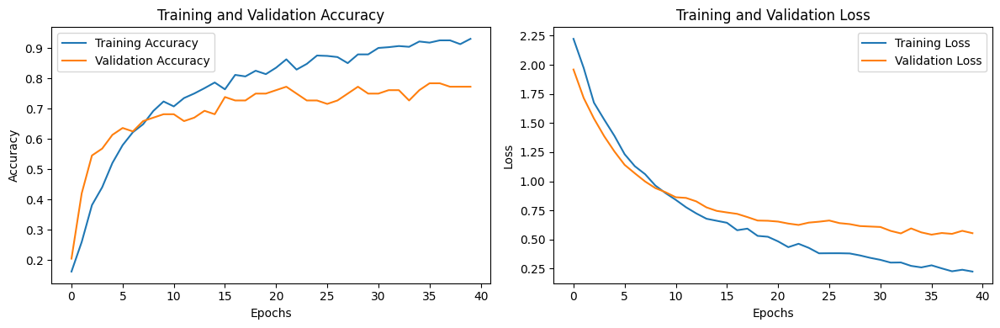

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset without augmentation to get class_names
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names  # Get class names before mapping

# Data augmentation
data_augmentation = tfk.Sequential([
    tfl.RandomFlip('horizontal'),
    tfl.RandomRotation(0.2),
    tfl.RandomZoom(0.2),
])

# Apply data augmentation
train_ds = train_ds.map(lambda x, y: (data_augmentation(x), y))

# Load the ResNet101 model pre-trained on ImageNet
base_model = tfk.applications.ResNet101(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Fine-tuning the base model for transfer learning by unfreezing some layers
base_model.trainable = True
for layer in base_model.layers[:-30]:  # Freeze most layers and fine-tune the last few
    layer.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model with a lower learning rate
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.00001),  # Reduced learning rate for fine-tuning
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=40)  # Increase epochs for better fine-tuning

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")
print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")
print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix
conf_matrix = confusion_matrix(y_true, y_pred)
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Feature Extraction and Visualization

# Print layer names to identify appropriate layers for feature extraction
for i, layer in enumerate(base_model.layers):
    print(f"Layer {i}: {layer.name}")

# Choose a convolutional layer for feature extraction (for example, 'conv4_block6_out')
conv_layer_name = 'conv4_block6_out'  # Adjust based on the printed layer names

# Get the layer by name from the base model (ResNet101)
feature_extractor = tfk.Model(inputs=base_model.input, outputs=base_model.get_layer(conv_layer_name).output)

# Extract features from the validation set
for images, labels in val_ds.take(1):
    first_image = np.expand_dims(images[0].numpy(), axis=0)
    extracted_features = feature_extractor.predict(first_image)

# Visualizing the extracted feature maps
def visualize_features(features, title):
    grid_size = int(np.sqrt(features.shape[-1]))
    plt.figure(figsize=(15, 15))

    for i in range(min(grid_size ** 2, features.shape[-1])):
        plt.subplot(grid_size, grid_size, i + 1)
        plt.imshow(features[0, :, :, i], cmap='viridis')
        plt.axis('off')

    plt.suptitle(title)
    plt.show()

# Visualize feature maps for the first image in validation set
visualize_features(extracted_features, title=f"Feature Maps for Class: {class_names[labels[0]]}")

# 6. Visualizing RGB Layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')

# 7. Visualizing Training and Validation Accuracy and Loss
plt.figure(figsize=(12, 4))
plt.subplot(1, 2, 1)
plt.plot(history.history['accuracy'], label='Training Accuracy')
plt.plot(history.history['val_accuracy'], label='Validation Accuracy')
plt.title('Training and Validation Accuracy')
plt.xlabel('Epochs')
plt.ylabel('Accuracy')
plt.legend()

plt.subplot(1, 2, 2)
plt.plot(history.history['loss'], label='Training Loss')
plt.plot(history.history['val_loss'], label='Validation Loss')
plt.title('Training and Validation Loss')
plt.xlabel('Epochs')
plt.ylabel('Loss')
plt.legend()

plt.tight_layout()
plt.show()

**InceptionV3**

Found 885 files belonging to 8 classes.
Using 797 files for training.
Found 885 files belonging to 8 classes.
Using 88 files for validation.
Epoch 1/30
25/25 [==============================] - 25s 581ms/step - loss: 41.2160 - accuracy: 0.1443 - val_loss: 11.4022 - val_accuracy: 0.2045
Epoch 2/30
25/25 [==============================] - 16s 455ms/step - loss: 20.4317 - accuracy: 0.2208 - val_loss: 5.0720 - val_accuracy: 0.3977
Epoch 3/30
25/25 [==============================] - 16s 459ms/step - loss: 9.3655 - accuracy: 0.3187 - val_loss: 3.0783 - val_accuracy: 0.4091
Epoch 4/30
25/25 [==============================] - 16s 433ms/step - loss: 4.7840 - accuracy: 0.3601 - val_loss: 2.3163 - val_accuracy: 0.3750
Epoch 5/30
25/25 [==============================] - 16s 459ms/step - loss: 2.9075 - accuracy: 0.3714 - val_loss: 1.8172 - val_accuracy: 0.3523
Epoch 6/30
25/25 [==============================] - 16s 439ms/step - loss: 1.9216 - accuracy: 0.3576 - val_loss: 1.6691 - val_accuracy: 0.295

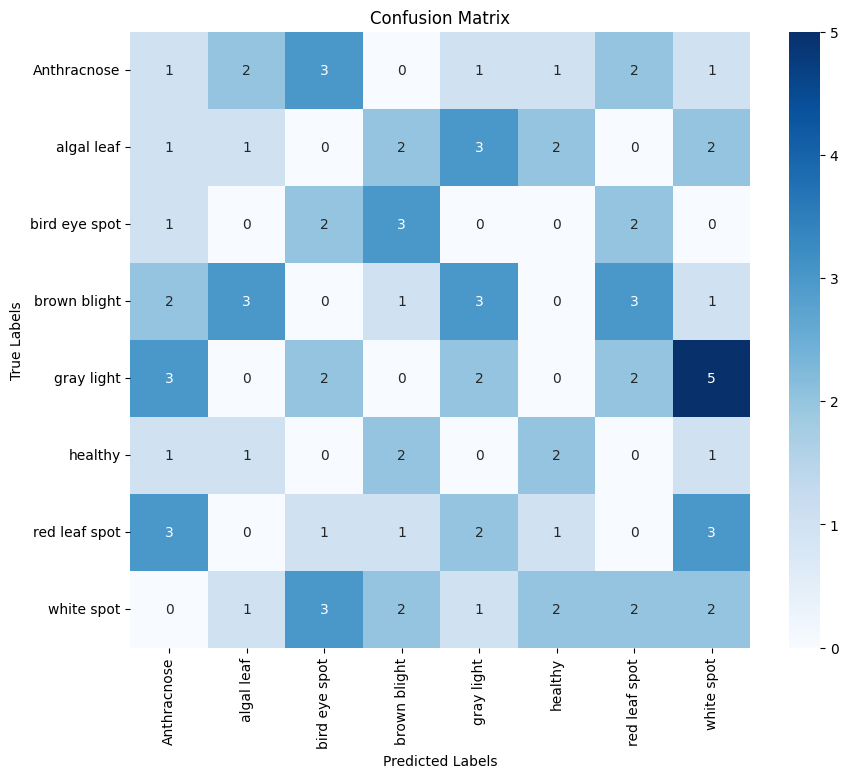

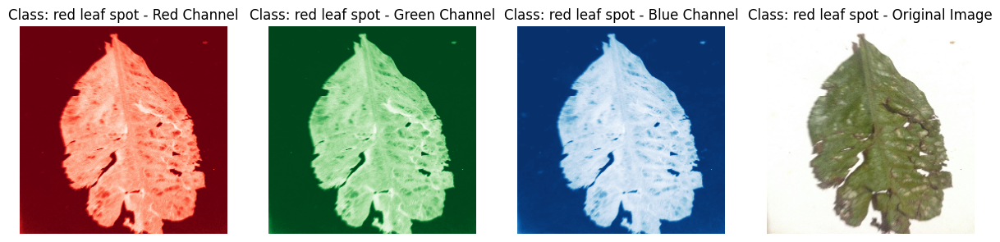

In [ ]:
import tensorflow as tf
import tensorflow.keras as tfk
import tensorflow.keras.layers as tfl
import matplotlib.pyplot as plt
import numpy as np
import seaborn as sns
from sklearn.metrics import confusion_matrix, accuracy_score, precision_score, recall_score, f1_score, classification_report

# Define constants
batch_size = 32
img_height = 256
img_width = 256

# Load and preprocess the dataset
train_dir = '/kaggle/input/identifying-disease-in-tea-leafs/tea sickness dataset'
train_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='training',
    image_size=(img_height, img_width),
    batch_size=batch_size
)
val_ds = tfk.utils.image_dataset_from_directory(
    train_dir,
    seed=42,
    validation_split=0.1,
    subset='validation',
    image_size=(img_height, img_width),
    batch_size=batch_size
)

class_names = train_ds.class_names

# Load the InceptionV3 model pre-trained on ImageNet
base_model = tfk.applications.InceptionV3(input_shape=(img_height, img_width, 3), include_top=False, weights='imagenet')

# Freeze the base model
base_model.trainable = False

# Add custom layers on top of the base model
model = tfk.Sequential([
    base_model,
    tfl.GlobalAveragePooling2D(),  # Use Global Average Pooling instead of Flatten
    tfl.Dense(256, activation='relu'),
    tfl.Dropout(0.5),
    tfl.Dense(len(class_names), activation='softmax')
])

# Compile the model
model.compile(optimizer=tfk.optimizers.Adam(learning_rate=0.0001),
              loss='sparse_categorical_crossentropy',
              metrics=['accuracy'])

# Train the model
history = model.fit(train_ds, validation_data=val_ds, epochs=30)

# Evaluate the model
model.evaluate(val_ds)

# 1. Printing Accuracy
train_acc = history.history['accuracy'][-1]  # Accuracy of the last epoch
val_acc = history.history['val_accuracy'][-1]  # Validation accuracy of the last epoch
print(f"Training Accuracy: {train_acc:.4f}")
print(f"Validation Accuracy: {val_acc:.4f}")

# 2. Getting predictions on the validation set
y_true = np.concatenate([y for x, y in val_ds], axis=0)
y_pred = np.argmax(model.predict(val_ds), axis=1)

# 3. Printing Accuracy, Precision, Recall, and F1 Score

# Accuracy
accuracy = accuracy_score(y_true, y_pred)
print(f"Accuracy: {accuracy:.4f}")

# Precision, Recall, F1-Score (Macro, Micro, Weighted)
precision_macro = precision_score(y_true, y_pred, average='macro')
precision_micro = precision_score(y_true, y_pred, average='micro')
precision_weighted = precision_score(y_true, y_pred, average='weighted')

recall_macro = recall_score(y_true, y_pred, average='macro')
recall_micro = recall_score(y_true, y_pred, average='micro')
recall_weighted = recall_score(y_true, y_pred, average='weighted')

f1_macro = f1_score(y_true, y_pred, average='macro')
f1_micro = f1_score(y_true, y_pred, average='micro')
f1_weighted = f1_score(y_true, y_pred, average='weighted')

print(f"Precision (Macro): {precision_macro:.4f}")
print(f"Precision (Micro): {precision_micro:.4f}")
print(f"Precision (Weighted): {precision_weighted:.4f}")

print(f"Recall (Macro): {recall_macro:.4f}")
print(f"Recall (Micro): {recall_micro:.4f}")
print(f"Recall (Weighted): {recall_weighted:.4f}")

print(f"F1 Score (Macro): {f1_macro:.4f}")
print(f"F1 Score (Micro): {f1_micro:.4f}")
print(f"F1 Score (Weighted): {f1_weighted:.4f}")

# Alternatively, you can print a classification report that includes precision, recall, and F1 for each class
print("\nClassification Report:\n")
print(classification_report(y_true, y_pred, target_names=class_names))

# 4. Visualizing the Confusion Matrix

# Compute the confusion matrix
conf_matrix = confusion_matrix(y_true, y_pred)

# Plot the confusion matrix
plt.figure(figsize=(10, 8))
sns.heatmap(conf_matrix, annot=True, fmt="d", cmap="Blues", xticklabels=class_names, yticklabels=class_names)
plt.title('Confusion Matrix')
plt.xlabel('Predicted Labels')
plt.ylabel('True Labels')
plt.show()

# 5. Visualizing RGB Layers

# Visualizing a sample image's RGB layers
def plot_rgb_layers(image, title):
    plt.figure(figsize=(15, 5))

    # Red channel
    plt.subplot(1, 4, 1)
    plt.imshow(image[..., 0], cmap='Reds')
    plt.title(f'{title} - Red Channel')
    plt.axis('off')

    # Green channel
    plt.subplot(1, 4, 2)
    plt.imshow(image[..., 1], cmap='Greens')
    plt.title(f'{title} - Green Channel')
    plt.axis('off')

    # Blue channel
    plt.subplot(1, 4, 3)
    plt.imshow(image[..., 2], cmap='Blues')
    plt.title(f'{title} - Blue Channel')
    plt.axis('off')

    # Original Image
    plt.subplot(1, 4, 4)
    plt.imshow(image.astype("uint8"))
    plt.title(f'{title} - Original Image')
    plt.axis('off')

    plt.show()

# Plot RGB layers for the first image in the validation set
for images, labels in val_ds.take(1):
    first_image = images[0].numpy()
    plot_rgb_layers(first_image, title=f'Class: {class_names[labels[0]]}')